In [1]:
from google.colab import drive

# Unmount the drive first
drive.flush_and_unmount()
print('Drive unmounted')

# Remove existing files from the mountpoint if it exists
import os
if os.path.exists('/content/drive'):
  !rm -rf '/content/drive'  # Use with caution! This permanently deletes all files in the directory.
  print('Files removed from mountpoint')

# Remount the drive
drive.mount('/content/drive')
print('Drive mounted')

Drive not mounted, so nothing to flush and unmount.
Drive unmounted
Mounted at /content/drive
Drive mounted


Exploring Classical Song:

In [2]:
# Usual Libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import sklearn

# Librosa
import librosa
import librosa.display
import IPython.display as ipd
import warnings
warnings.filterwarnings('ignore')
import os
general_path = "/content/drive/Shareddrives/Machine_Learning_Project_Drive/Youtube_Data"
# print(list(os.listdir(f'{general_path}')))

# Importing 1 file
y, sr = librosa.load(f'{general_path}/Classical/Bach - Air - Best-of Classical Music.wav')


print('y:', y, '\n')
print('y shape:', np.shape(y), '\n')
print('Sample Rate (KHz):', sr, '\n')

# Verify length of the audio
print('Check Len of Audio:', 7202561/22050)

y: [0. 0. 0. ... 0. 0. 0.] 

y shape: (7904768,) 

Sample Rate (KHz): 22050 

Check Len of Audio: 326.64675736961453


Sound Wave Shape:

Audio File: [ 2.0516214e-05  1.0675902e-05  2.2409178e-05 ... -9.1552844e-05
 -9.1552618e-05 -9.1552865e-05] 

Audio File shape: (7824384,)


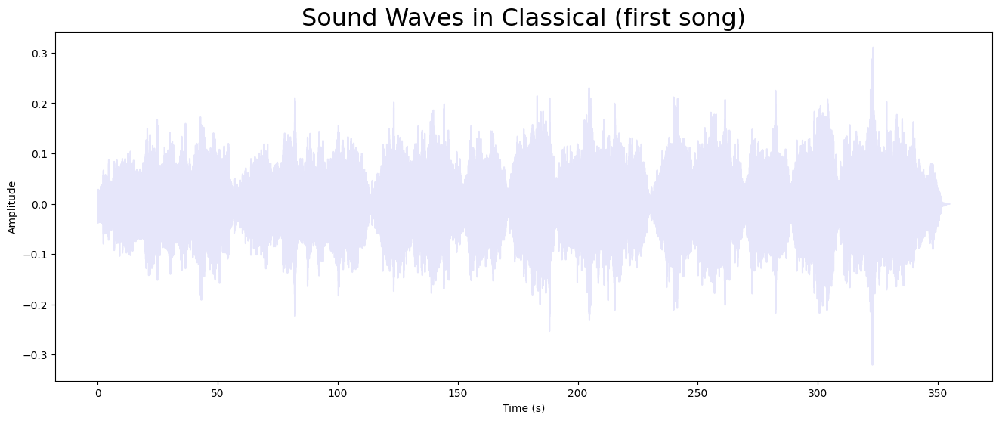

In [3]:
# Trim leading and trailing silence from an audio signal (silence before and after the actual audio)
audio_file, _ = librosa.effects.trim(y)

# the result is an numpy ndarray
print('Audio File:', audio_file, '\n')
print('Audio File shape:', np.shape(audio_file))


# Create the waveform plot with matplotlib
plt.figure(figsize=(16, 6))
plt.plot(np.linspace(0, len(audio_file) / sr, num=len(audio_file)), audio_file, color="#E6E6FA")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.title("Sound Waves in Classical (first song)", fontsize=23)
plt.show()

Short-Time Fourier Transform:

In [4]:
# Default FFT window size
n_fft = 2048 # FFT window size
hop_length = 512 # number audio of frames between STFT columns (looks like a good default)

# Short-time Fourier transform (STFT)
D = np.abs(librosa.stft(audio_file, n_fft = n_fft, hop_length = hop_length))

print('Shape of D object:', np.shape(D))





Shape of D object: (1025, 15283)


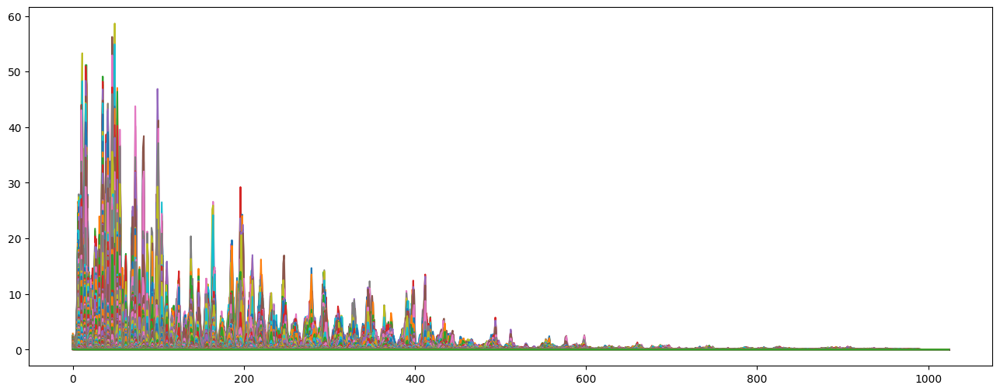

In [5]:
plt.figure(figsize = (16, 6))
plt.plot(D);

Spectogram:

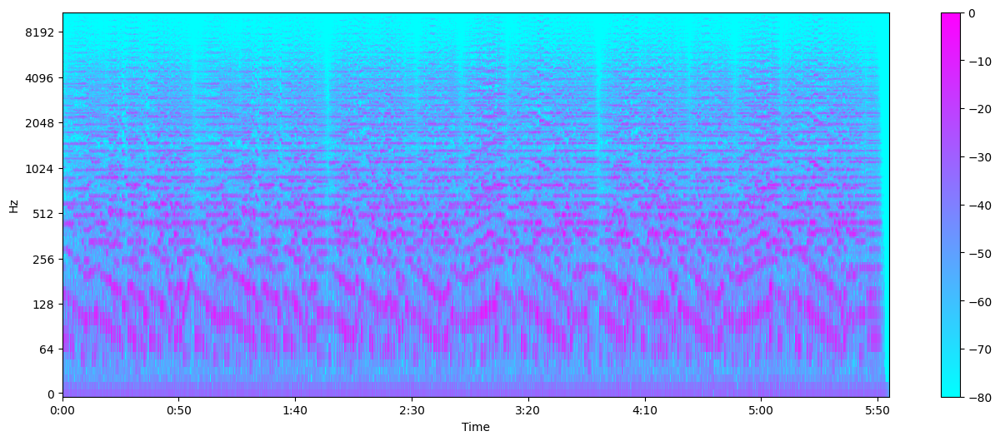

In [6]:
# Convert an amplitude spectrogram to Decibels-scaled spectrogram.
DB = librosa.amplitude_to_db(D, ref = np.max)

# Creating the Spectogram
plt.figure(figsize = (16, 6))
librosa.display.specshow(DB, sr = sr, hop_length = hop_length, x_axis = 'time', y_axis = 'log',
                        cmap = 'cool')
plt.colorbar();

Mel Spectogram:

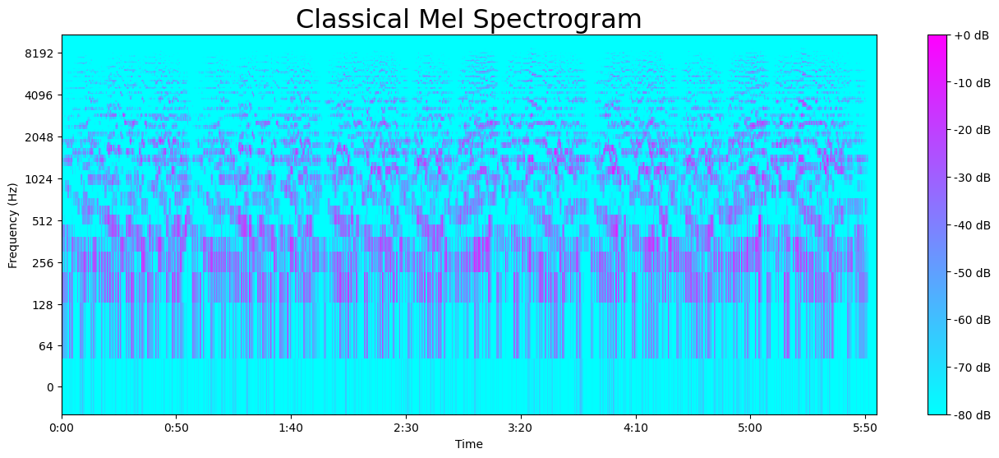

In [7]:
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt

# Load and trim the audio file
y, sr = librosa.load(f'{general_path}/Classical/Bach - Air - Best-of Classical Music.wav')
y, _ = librosa.effects.trim(y)

# Generate the Mel spectrogram
S = librosa.feature.melspectrogram(y=y, sr=sr)
S_DB = librosa.amplitude_to_db(S, ref=np.max)

# Plot the Mel spectrogram
plt.figure(figsize=(16, 6))
librosa.display.specshow(S_DB, sr=sr, hop_length=512, x_axis='time', y_axis='log', cmap='cool')
plt.colorbar(format='%+2.0f dB')
plt.title("Classical Mel Spectrogram", fontsize=23)
plt.xlabel("Time")
plt.ylabel("Frequency (Hz)")
plt.show()


Harmonics and Perceptrual:

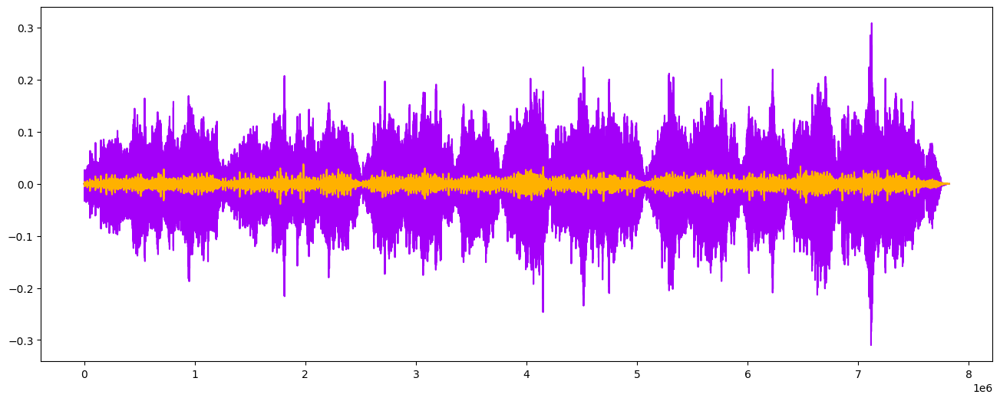

In [8]:
#Harmonics and Perceptrual
y, sr = librosa.load(f'{general_path}/Classical/Bach - Air - Best-of Classical Music.wav')
y, _ = librosa.effects.trim(y)

y_harm, y_perc = librosa.effects.hpss(audio_file)

plt.figure(figsize = (16, 6))
plt.plot(y_harm, color = '#A300F9');
plt.plot(y_perc, color = '#FFB100');

Spectral Centroid along the waveform:

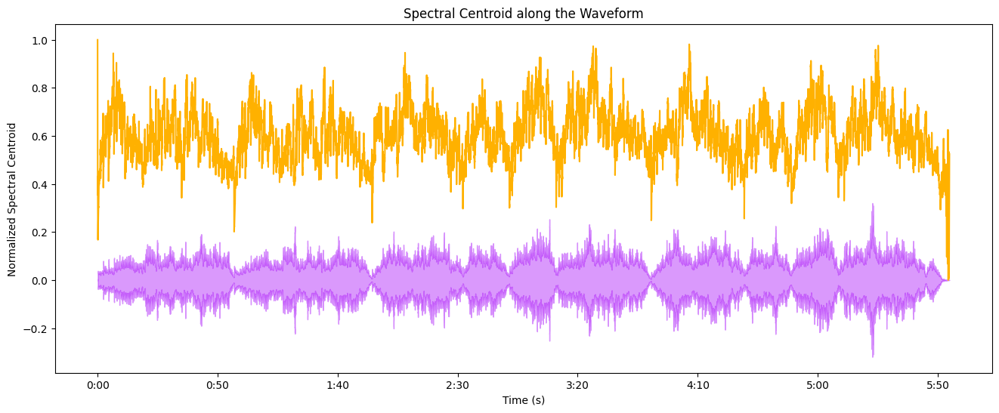

In [12]:
import sklearn.preprocessing
import matplotlib.pyplot as plt
import librosa
import librosa.display

def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)

# Plotting the Spectral Centroid along the waveform
spectral_centroids = librosa.feature.spectral_centroid(y=audio_file, sr=sr)[0]
frames = range(len(spectral_centroids))

# Converts frame counts to time (seconds)
t = librosa.frames_to_time(frames)

plt.figure(figsize=(16, 6))
librosa.display.waveshow(audio_file, sr=sr, alpha=0.4, color='#A300F9')
plt.plot(t, normalize(spectral_centroids), color='#FFB100')
plt.title('Spectral Centroid along the Waveform')
plt.xlabel('Time (s)')
plt.ylabel('Normalized Spectral Centroid')
plt.show()

Spectral Rolloff along the Waveform:

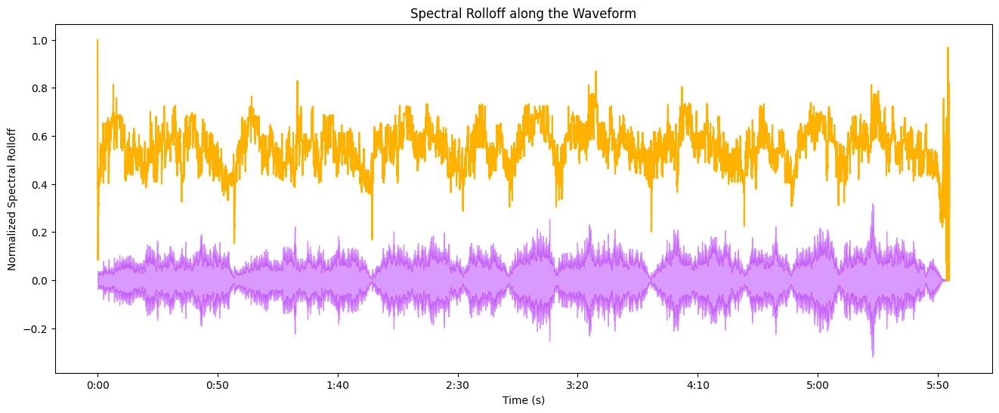

In [14]:
import sklearn.preprocessing
import matplotlib.pyplot as plt
import librosa
import librosa.display

def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)

# Spectral RollOff Vector
spectral_rolloff = librosa.feature.spectral_rolloff(y=audio_file, sr=sr)[0]

# Converts frame counts to time (seconds)
frames = range(len(spectral_rolloff))
t = librosa.frames_to_time(frames)

# The plot
plt.figure(figsize=(16, 6))
librosa.display.waveshow(audio_file, sr=sr, alpha=0.4, color='#A300F9')
plt.plot(t, normalize(spectral_rolloff), color='#FFB100')
plt.title('Spectral Rolloff along the Waveform')
plt.xlabel('Time (s)')
plt.ylabel('Normalized Spectral Rolloff')
plt.show()

MFCCs:

mfccs shape: (20, 15283)


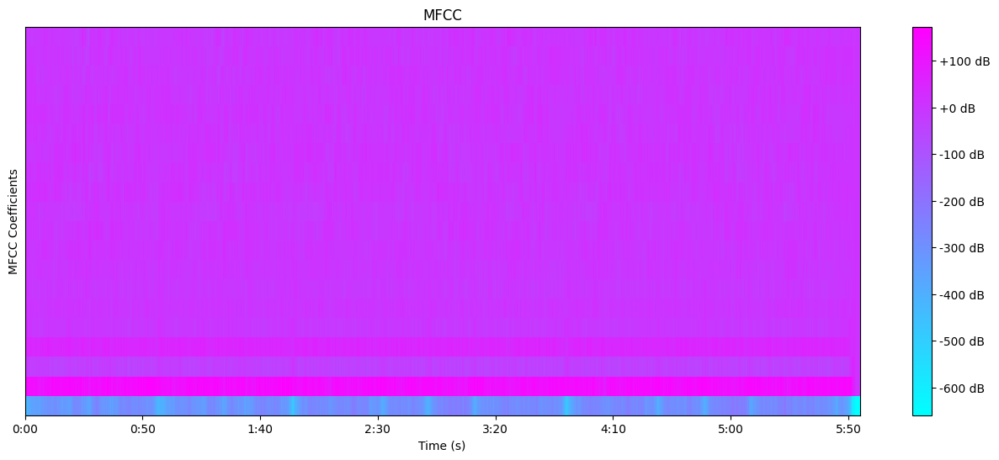

In [16]:
import sklearn.preprocessing
import matplotlib.pyplot as plt
import librosa
import librosa.display

# Load the audio file
audio_file, sr = librosa.load(f'{general_path}/Classical/Bach - Air - Best-of Classical Music.wav')
audio_file, _ = librosa.effects.trim(audio_file)

# Mel-Frequency Cepstral Coefficients
mfccs = librosa.feature.mfcc(y=audio_file, sr=sr)
print('mfccs shape:', mfccs.shape)

# Displaying the MFCCs
plt.figure(figsize=(16, 6))
librosa.display.specshow(mfccs, sr=sr, x_axis='time', cmap='cool')
plt.colorbar(format='%+2.0f dB')
plt.title('MFCC')
plt.xlabel('Time (s)')
plt.ylabel('MFCC Coefficients')
plt.show()

Scaled MFCCs:

Mean: 0.0 

Var: 1.0


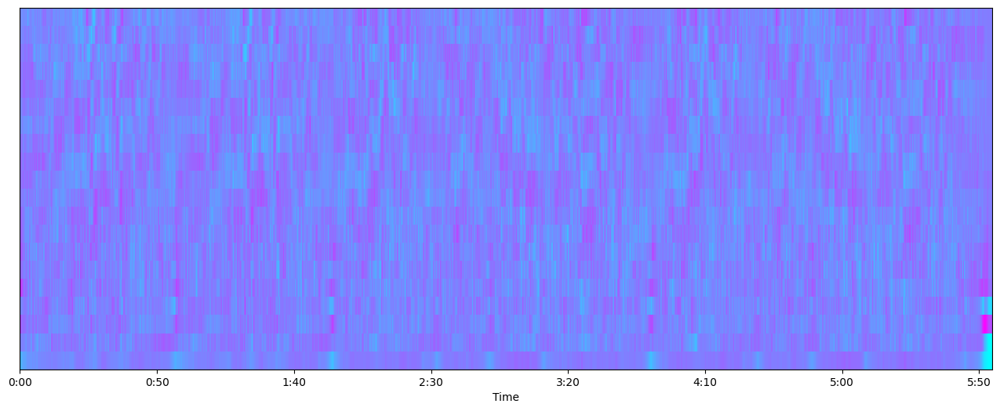

In [17]:
# Perform Feature Scaling
mfccs = sklearn.preprocessing.scale(mfccs, axis=1)
print('Mean:', mfccs.mean(), '\n')
print('Var:', mfccs.var())

plt.figure(figsize = (16, 6))
librosa.display.specshow(mfccs, sr=sr, x_axis='time', cmap = 'cool');

Chromogram:

Chromogram shape: (12, 1565)


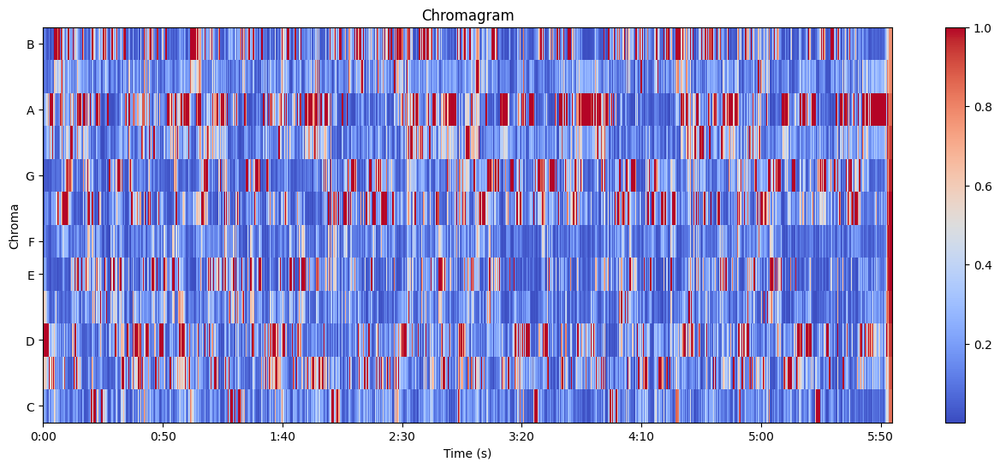

In [19]:
import sklearn.preprocessing
import matplotlib.pyplot as plt
import librosa
import librosa.display

# Increase or decrease hop_length to change how granular you want your data to be
hop_length = 5000

# Chromogram
chromagram = librosa.feature.chroma_stft(y=audio_file, sr=sr, hop_length=hop_length)
print('Chromogram shape:', chromagram.shape)

plt.figure(figsize=(16, 6))
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='coolwarm')
plt.colorbar()
plt.title('Chromagram')
plt.xlabel('Time (s)')
plt.ylabel('Chroma')
plt.show()

Analysis of Rock vs Classical:

Checking Data:

In [7]:
# Usual Libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import sklearn

# Librosa
import librosa
import librosa.display
import IPython.display as ipd
import warnings
warnings.filterwarnings('ignore')
import os
general_path = "/content/drive/Shareddrives/Machine_Learning_Project_Drive/Youtube_Data"
# print(list(os.listdir(f'{general_path}')))

# Importing 2 files
y, sr = librosa.load(f'{general_path}/Classical/Bach - Air - Best-of Classical Music.wav')
z, sr2 = librosa.load(f'{general_path}/Rock/AC⧸DC - Highway to Hell.wav')

print('y:', y, '\n')
print('y shape:', np.shape(y), '\n')
print('Sample Rate (KHz):', sr, '\n')

# Verify length of the audio
print('Check Len of Audio:', 7904768/22050)

print('z:', z, '\n')
print('z shape:', np.shape(z), '\n')
print('Sample Rate (KHz):', sr2, '\n')

# Verify length of the audio
print('Check Len of Audio:', 4601857/22050)

y: [0. 0. 0. ... 0. 0. 0.] 

y shape: (7904768,) 

Sample Rate (KHz): 22050 

Check Len of Audio: 358.4928798185941
z: [ 0.0000000e+00  0.0000000e+00  0.0000000e+00 ... -2.9163097e-05
 -3.3244422e-05  0.0000000e+00] 

z shape: (4601857,) 

Sample Rate (KHz): 22050 

Check Len of Audio: 208.70099773242632


Classical Sound Wave:

Audio File: [ 2.0516214e-05  1.0675902e-05  2.2409178e-05 ... -9.1552844e-05
 -9.1552618e-05 -9.1552865e-05] 

Audio File shape: (7824384,)


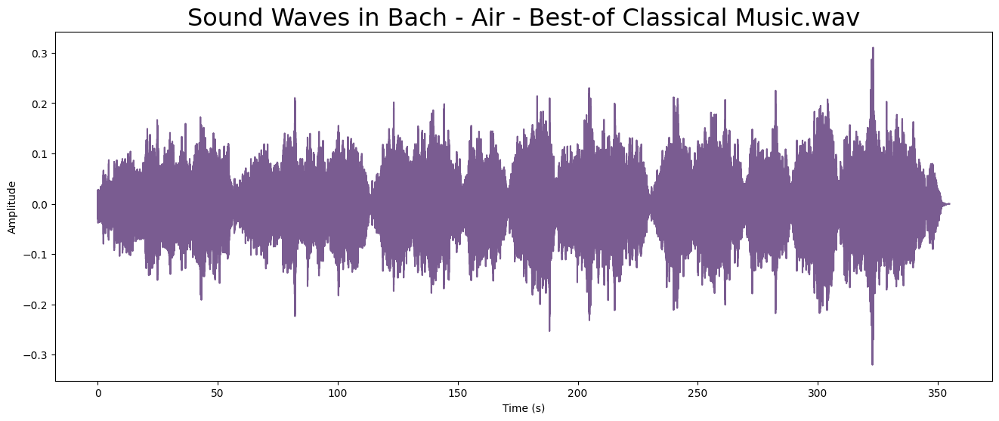

In [8]:
# Trim leading and trailing silence from an audio signal (silence before and after the actual audio)
audio_file, _ = librosa.effects.trim(y)

# the result is an numpy ndarray
print('Audio File:', audio_file, '\n')
print('Audio File shape:', np.shape(audio_file))


# Create the waveform plot with matplotlib
plt.figure(figsize=(16, 6))
plt.plot(np.linspace(0, len(audio_file) / sr, num=len(audio_file)), audio_file, color="#7A5C91")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.title("Sound Waves in Bach - Air - Best-of Classical Music.wav", fontsize=23)
plt.show()

Rock Sound Wave:

Audio File: [-5.3336494e-06 -2.5253839e-06  1.9040680e-06 ... -3.0537514e-05
 -3.0548286e-05 -3.0405774e-05] 

Audio File shape: (4587520,)


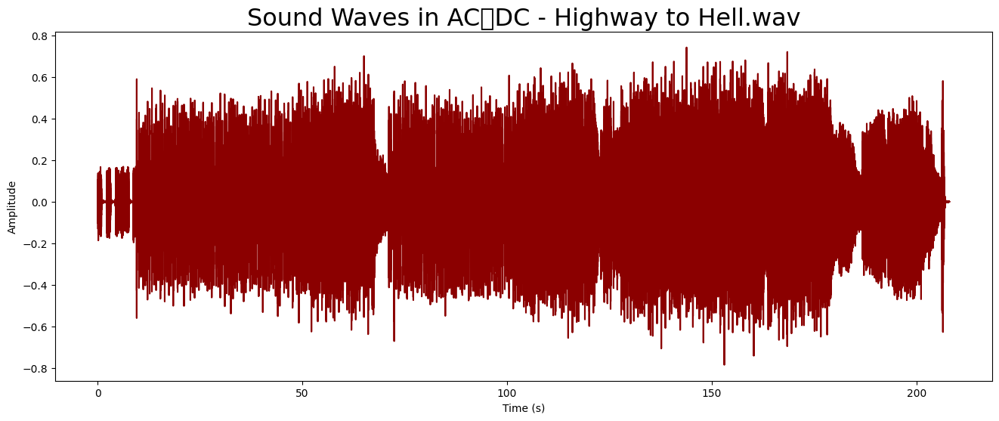

In [9]:
audio_file_2, _ = librosa.effects.trim(z)

# the result is an numpy ndarray
print('Audio File:', audio_file_2, '\n')
print('Audio File shape:', np.shape(audio_file_2))


# Create the waveform plot with matplotlib
plt.figure(figsize=(16, 6))
plt.plot(np.linspace(0, len(audio_file_2) / sr2, num=len(audio_file_2)), audio_file_2, color="#8B0000")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.title("Sound Waves in AC⧸DC - Highway to Hell.wav", fontsize=23)
plt.show()

Checking Shape:

In [11]:
# Default FFT window size
n_fft = 2048 # FFT window size
hop_length = 512 # number audio of frames between STFT columns
# Short-time Fourier transform (STFT)
D = np.abs(librosa.stft(audio_file, n_fft = n_fft, hop_length = hop_length))

print('Shape of D object 1:', np.shape(D))

#for audio 2:
D_2 = np.abs(librosa.stft(audio_file_2, n_fft = n_fft, hop_length = hop_length))

print('Shape of D object 2:', np.shape(D_2))

Shape of D object 1: (1025, 15283)
Shape of D object 2: (1025, 8961)


In [ ]:
Classical Fourier Transform:

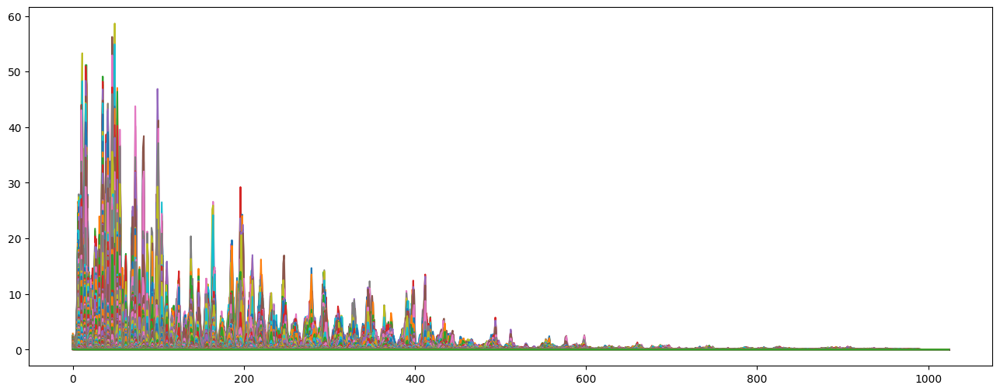

In [12]:
plt.figure(figsize = (16, 6))
plt.plot(D);

Rock Fourier Transform:

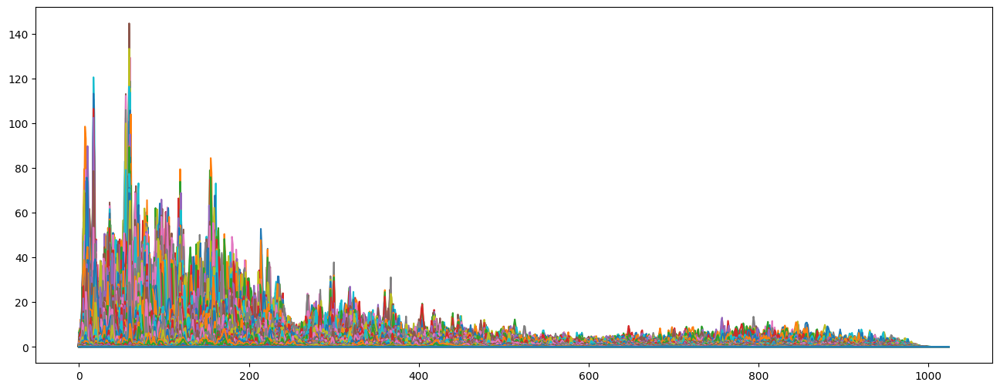

In [13]:
plt.figure(figsize = (16, 6))
plt.plot(D_2);

Classical Spectrogram:

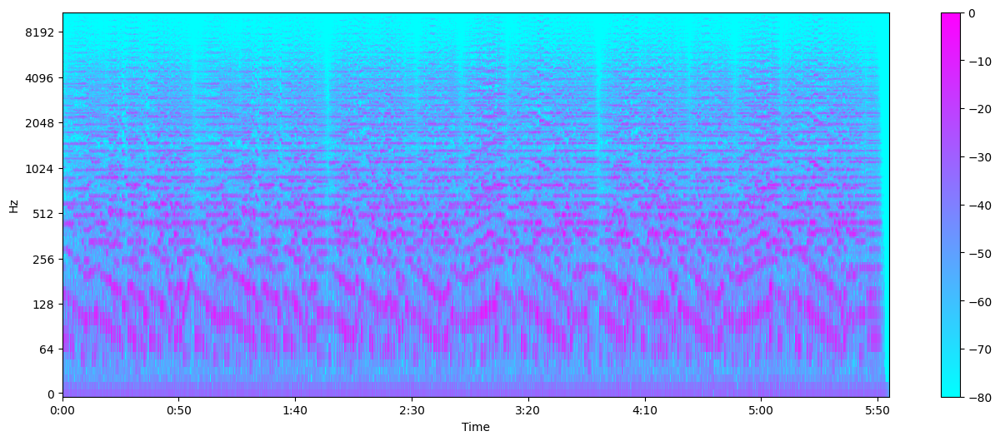

In [14]:
# Convert an amplitude spectrogram to Decibels-scaled spectrogram.
DB1 = librosa.amplitude_to_db(D, ref = np.max)

# Creating the Spectogram
plt.figure(figsize = (16, 6))
librosa.display.specshow(DB1, sr = sr, hop_length = hop_length, x_axis = 'time', y_axis = 'log',
                        cmap = 'cool')
plt.colorbar();

Rock Spectrogram:

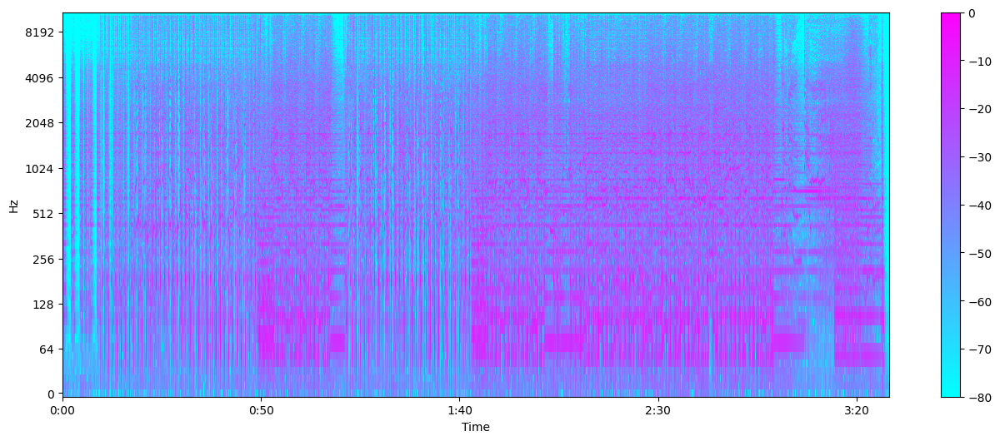

In [15]:
# Convert an amplitude spectrogram to Decibels-scaled spectrogram.
DB2 = librosa.amplitude_to_db(D_2, ref = np.max)

# Creating the Spectogram
plt.figure(figsize = (16, 6))
librosa.display.specshow(DB2, sr = sr2, hop_length = hop_length, x_axis = 'time', y_axis = 'log',
                        cmap = 'cool')
plt.colorbar();

Classical Mel Spectrogram:

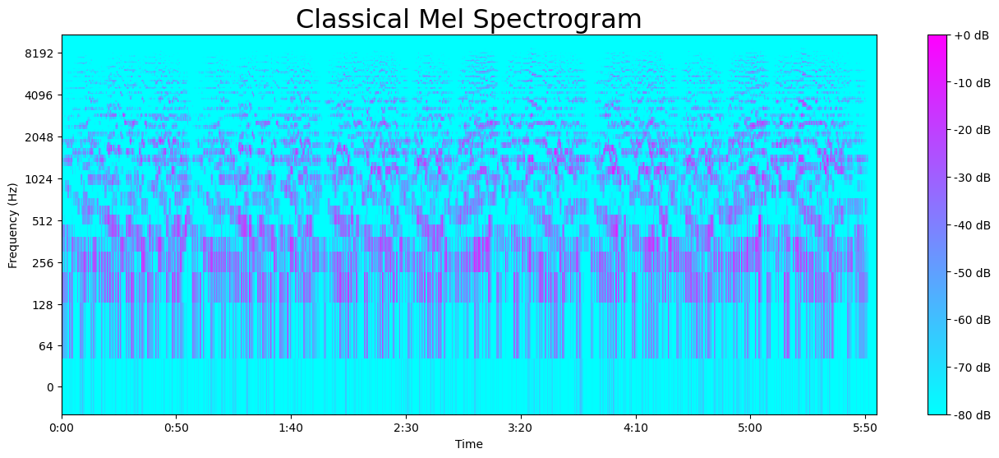

In [16]:
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt

# Load and trim the audio file
y, sr = librosa.load(f'{general_path}/Classical/Bach - Air - Best-of Classical Music.wav')
y, _ = librosa.effects.trim(y)

# Generate the Mel spectrogram
S = librosa.feature.melspectrogram(y=y, sr=sr)
S_DB = librosa.amplitude_to_db(S, ref=np.max)

# Plot the Mel spectrogram
plt.figure(figsize=(16, 6))
librosa.display.specshow(S_DB, sr=sr, hop_length=512, x_axis='time', y_axis='log', cmap='cool')
plt.colorbar(format='%+2.0f dB')
plt.title("Classical Mel Spectrogram", fontsize=23)
plt.xlabel("Time")
plt.ylabel("Frequency (Hz)")
plt.show()


Rock Mel Spectrogram:

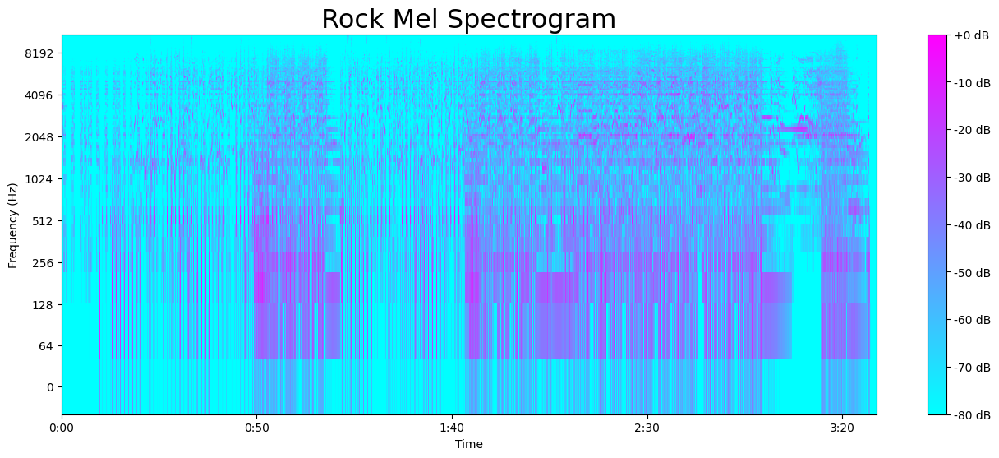

In [17]:
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt


# Generate the Mel spectrogram
S = librosa.feature.melspectrogram(y=z, sr=sr)
S_DB = librosa.amplitude_to_db(S, ref=np.max)

# Plot the Mel spectrogram
plt.figure(figsize=(16, 6))
librosa.display.specshow(S_DB, sr=sr2, hop_length=512, x_axis='time', y_axis='log', cmap='cool')
plt.colorbar(format='%+2.0f dB')
plt.title("Rock Mel Spectrogram", fontsize=23)
plt.xlabel("Time")
plt.ylabel("Frequency (Hz)")
plt.show()

Zero-Crossings:

In [18]:
zero_crossings_1 = librosa.zero_crossings(audio_file, pad=False)
print("Classical: ")
print(sum(zero_crossings_1))

print("Rock: ")
zero_crossings_2 = librosa.zero_crossings(audio_file_2, pad=False)
print(sum(zero_crossings_2))

Classical: 
667387
Rock: 
684122


Classical Harmonics and Perceptrual:

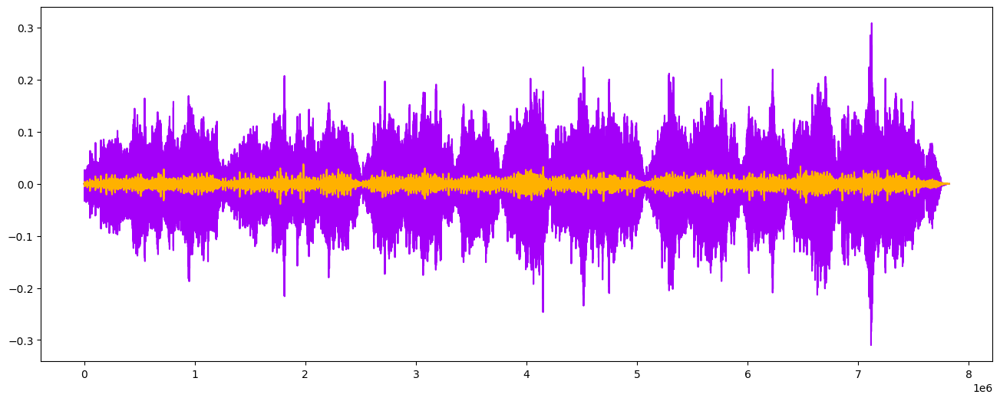

In [19]:
#Harmonics and Perceptrual
y_harm, y_perc = librosa.effects.hpss(audio_file)

plt.figure(figsize = (16, 6))
plt.plot(y_harm, color = '#A300F9');
plt.plot(y_perc, color = '#FFB100');

Rock Harmonics and Perceptual

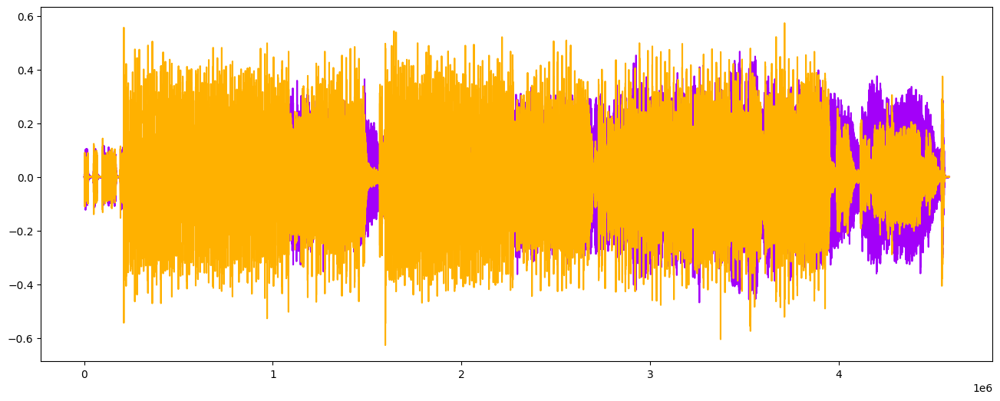

In [20]:
#Harmonics and Perceptrual
y_harm, y_perc = librosa.effects.hpss(audio_file_2)

plt.figure(figsize = (16, 6))
plt.plot(y_harm, color = '#A300F9');
plt.plot(y_perc, color = '#FFB100');

Classical Chromogram:

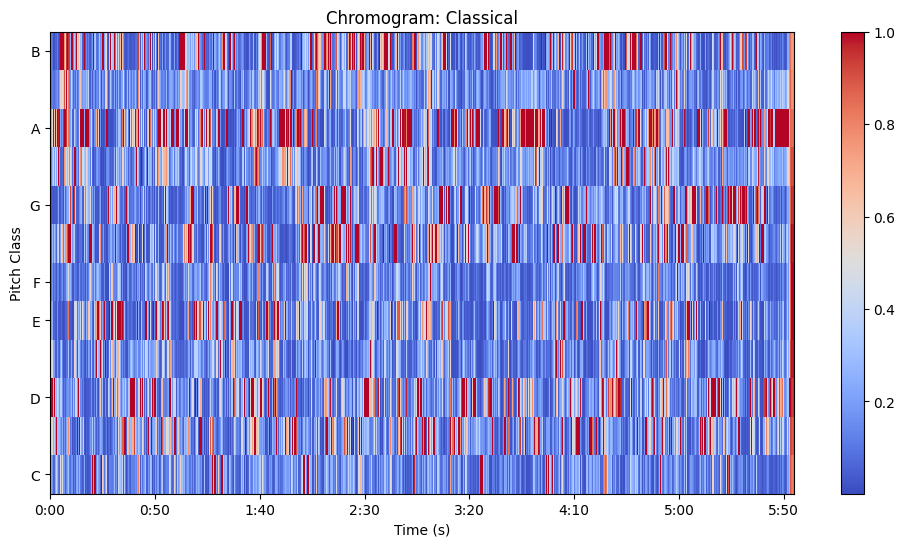

In [22]:
import librosa
import librosa.display
import matplotlib.pyplot as plt

# Compute the chromagram
chroma = librosa.feature.chroma_stft(y=y, sr=sr)

# Plot the chromagram
plt.figure(figsize=(12, 6))
librosa.display.specshow(chroma, x_axis='time', y_axis='chroma', cmap='coolwarm')
plt.colorbar()
plt.title('Chromogram: Classical')
plt.xlabel('Time (s)')
plt.ylabel('Pitch Class')
plt.show()

Rock Chromogram:

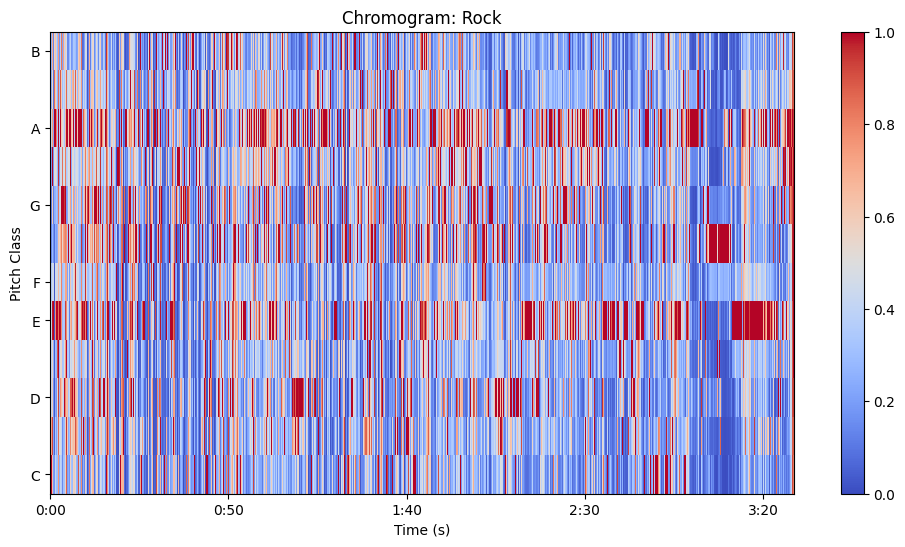

In [23]:
import librosa
import librosa.display
import matplotlib.pyplot as plt

# Compute the chromagram
chroma = librosa.feature.chroma_stft(y=z, sr=sr2)

# Plot the chromagram
plt.figure(figsize=(12, 6))
librosa.display.specshow(chroma, x_axis='time', y_axis='chroma', cmap='coolwarm')
plt.colorbar()
plt.title('Chromogram: Rock')
plt.xlabel('Time (s)')
plt.ylabel('Pitch Class')
plt.show()


Sound Wave of Songs From Each Genre:

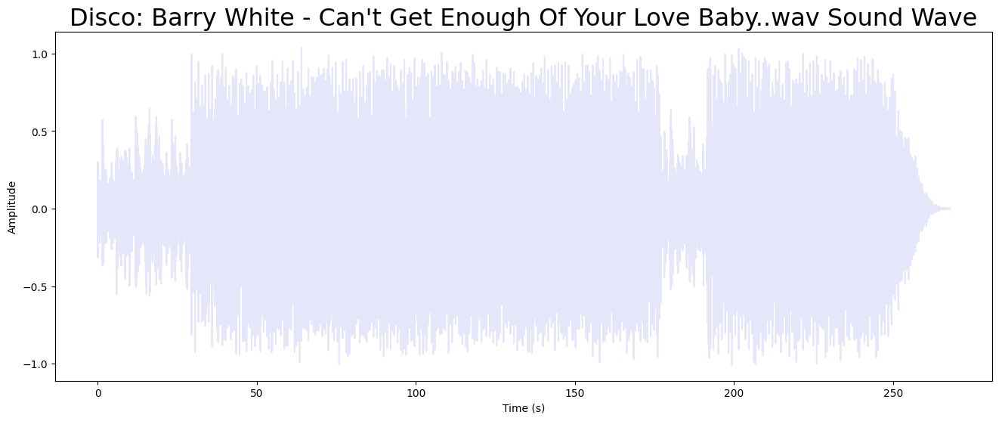

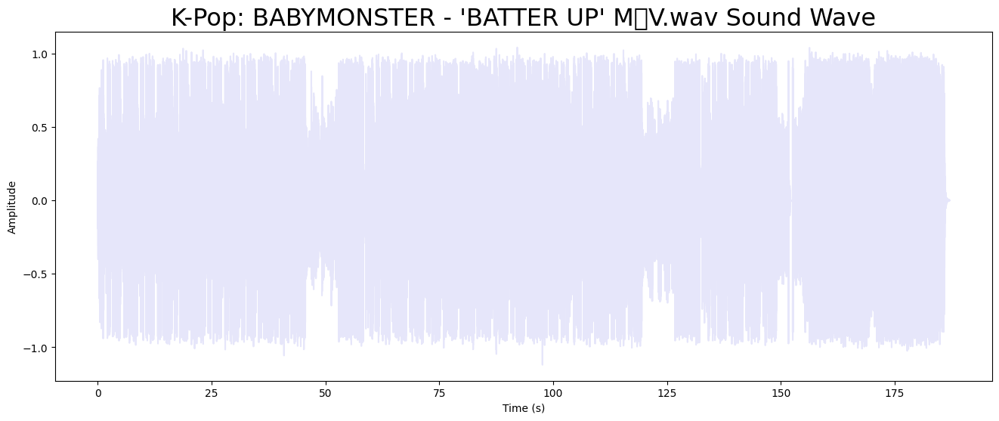

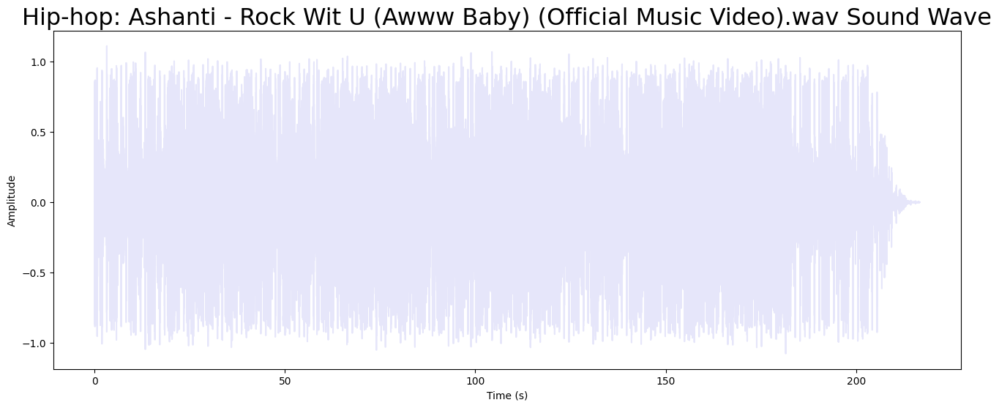

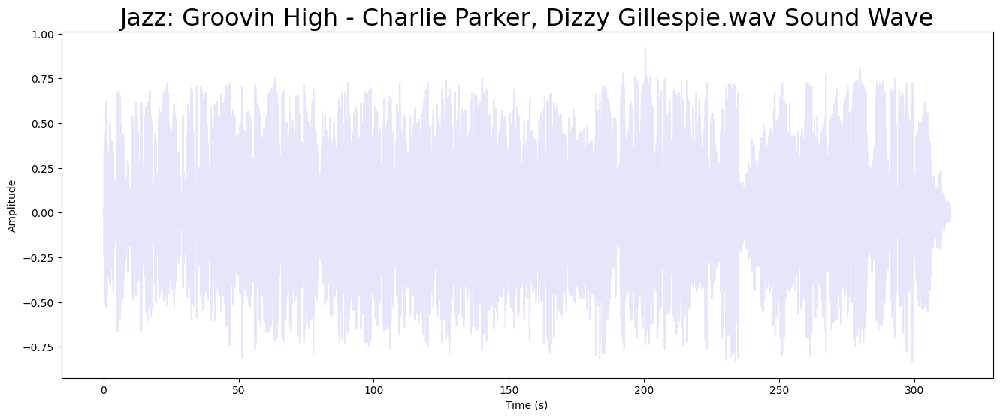

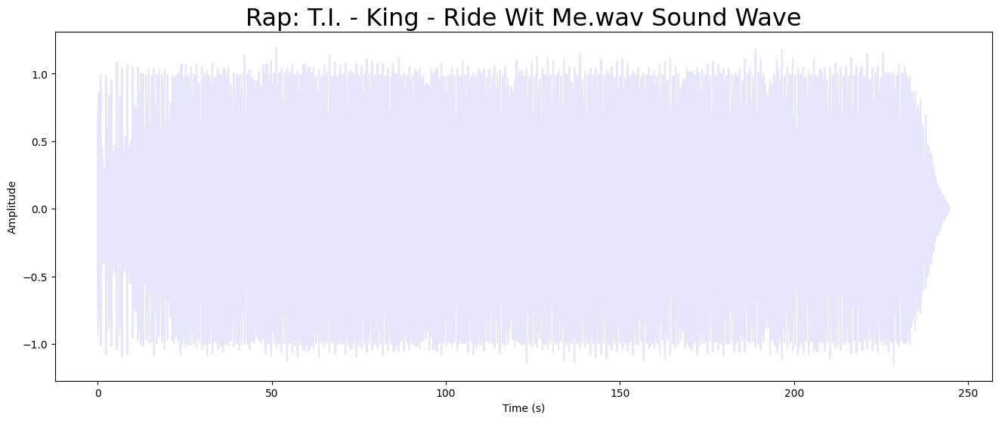

...

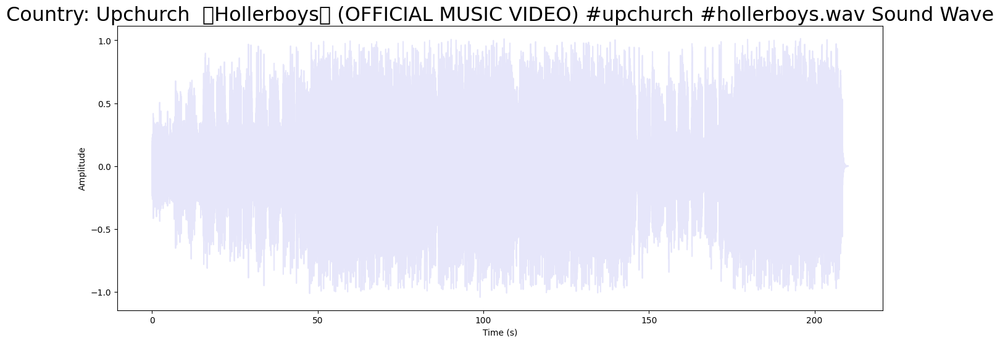

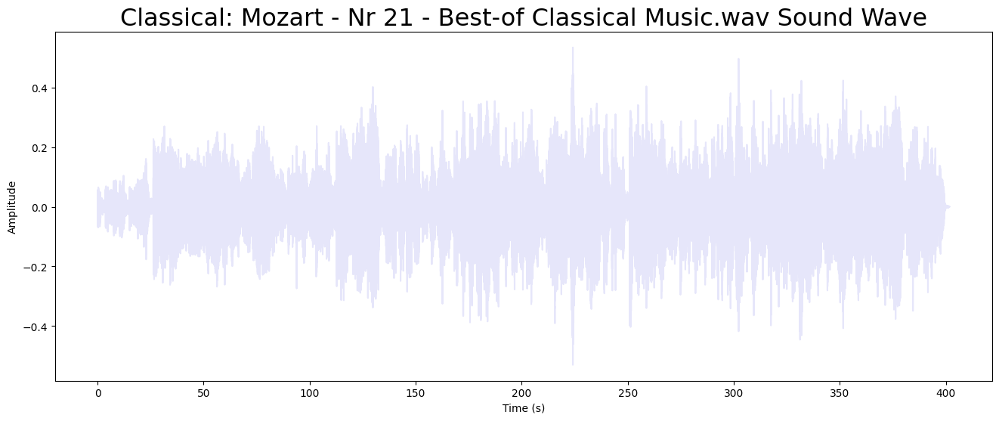

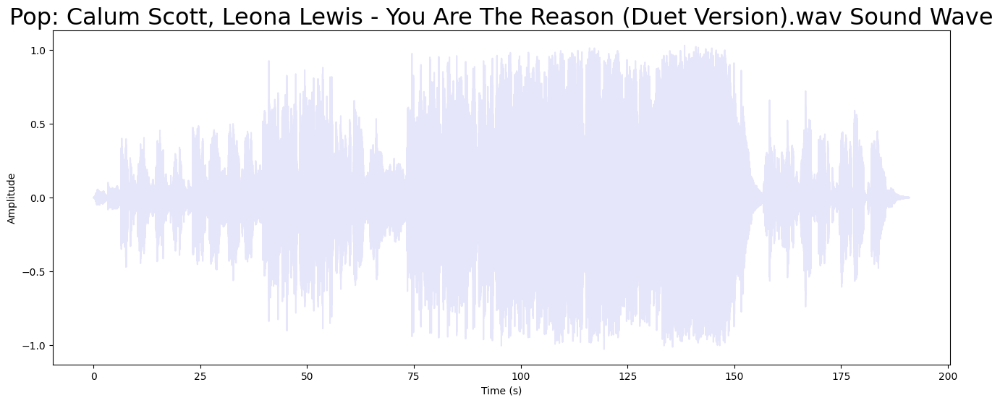

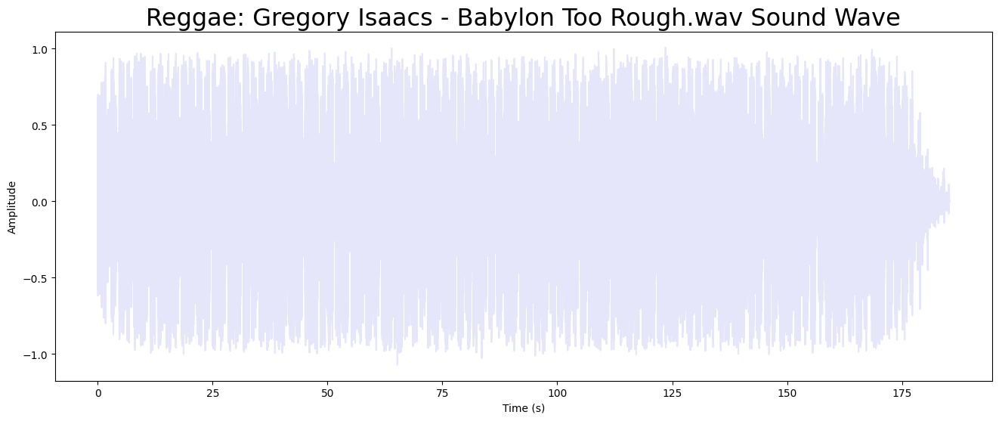

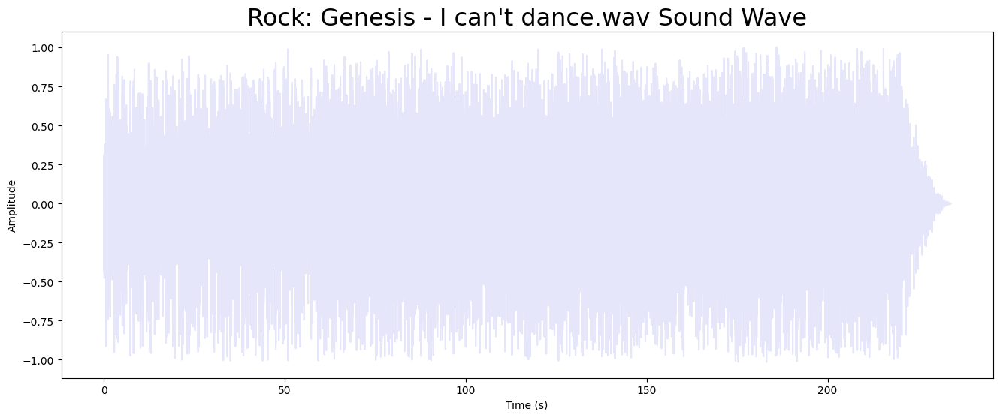

In [20]:
# Usual Libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import sklearn

# Librosa
import librosa
import librosa.display
import IPython.display as ipd
import warnings
warnings.filterwarnings('ignore')
import os
general_path = "/content/drive/Shareddrives/Machine_Learning_Project_Drive/Youtube_Data"

for genre in list(os.listdir(f'{general_path}')):
  if genre == ".ipynb_checkpoints":
    continue
  song = list(os.listdir(f'{general_path}/{genre}'))[11]
  y, sr = librosa.load(f'{general_path}/{genre}/{song}')
  audio_file, _ = librosa.effects.trim(y)
  plt.figure(figsize=(16, 6))
  plt.plot(np.linspace(0, len(audio_file) / sr, num=len(audio_file)), audio_file, color="#E6E6FA")
  plt.xlabel("Time (s)")
  plt.ylabel("Amplitude")
  plt.title(f'{genre}: {song} Sound Wave', fontsize=23)
  plt.show()



Fourier Transform of Songs From Each Genre:

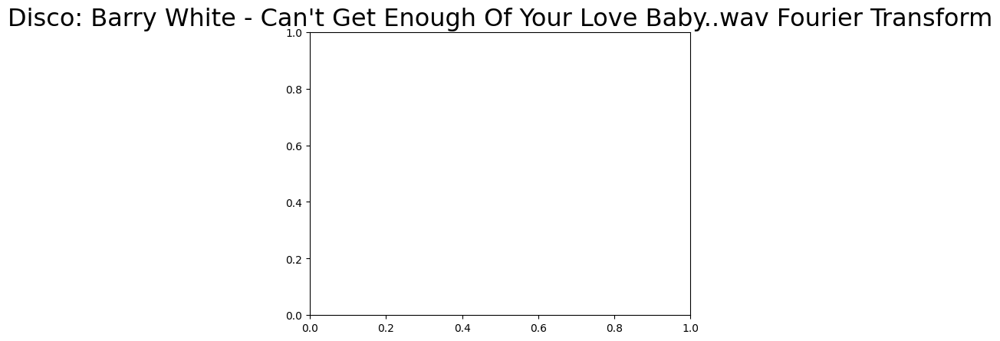

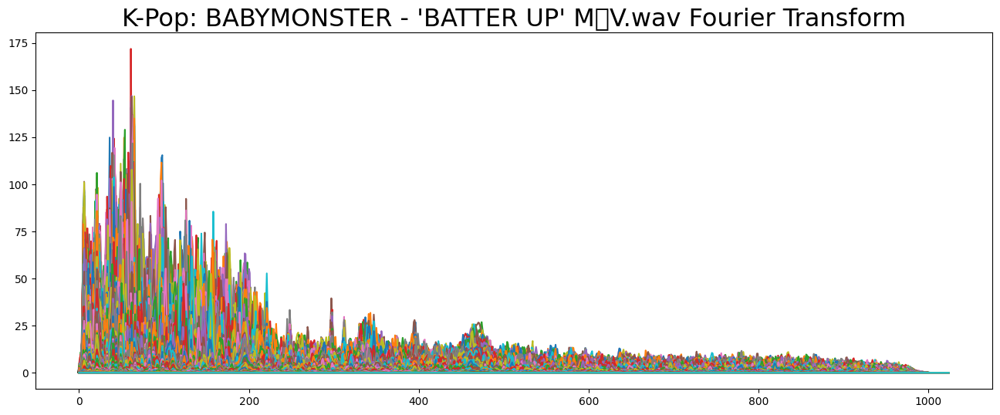

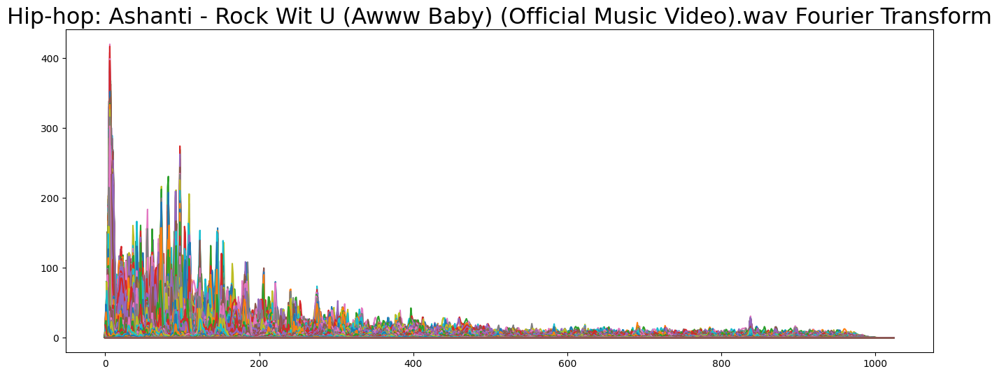

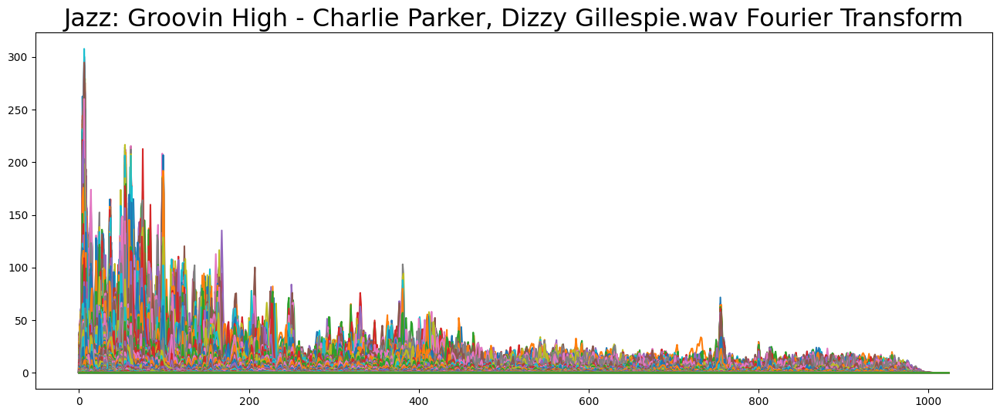

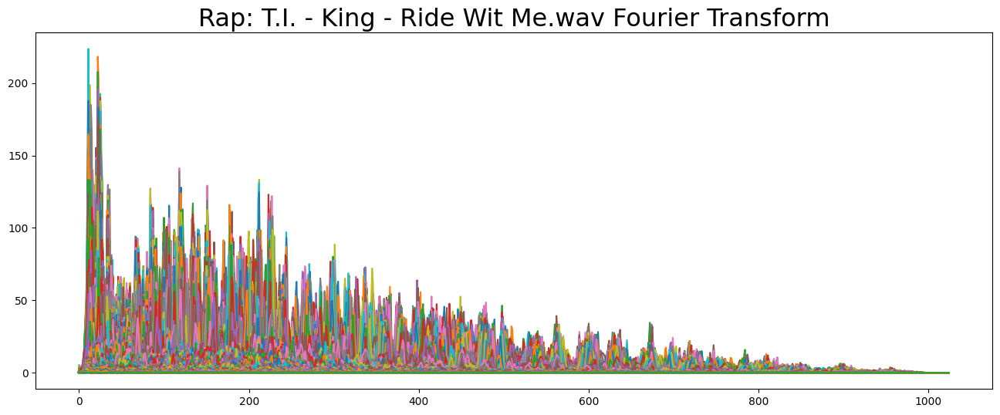

...

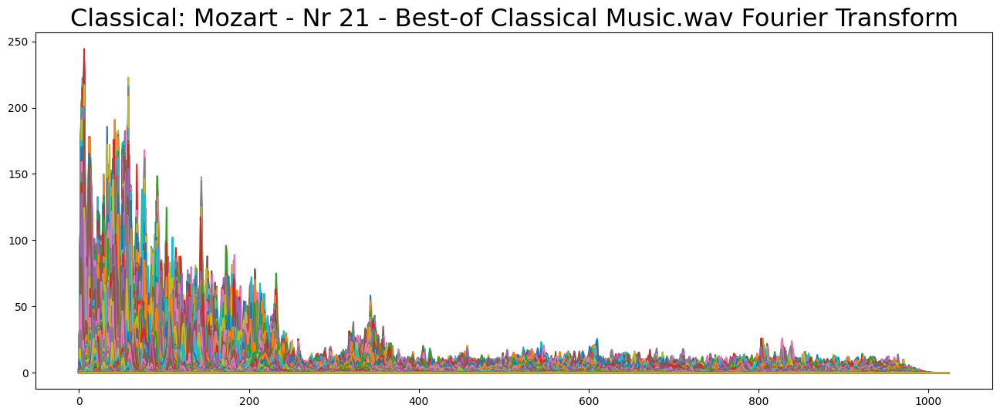

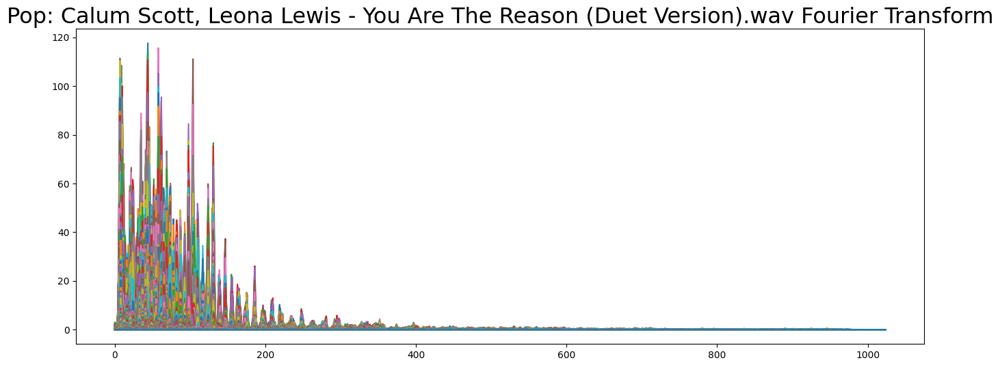

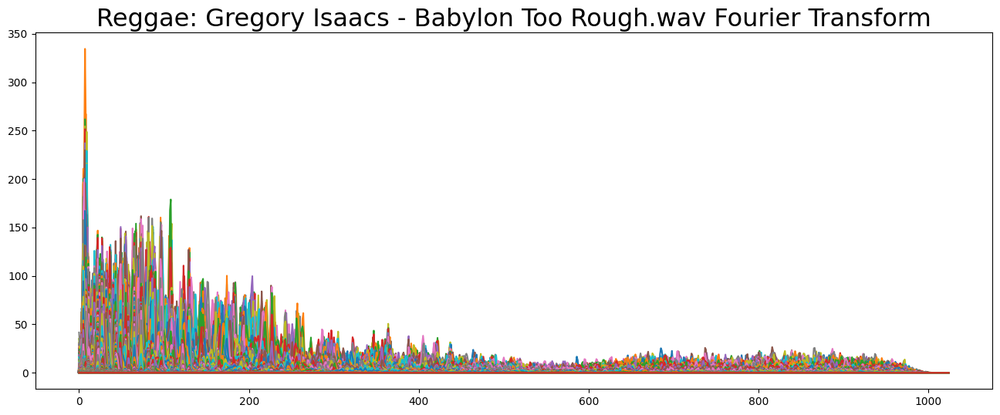

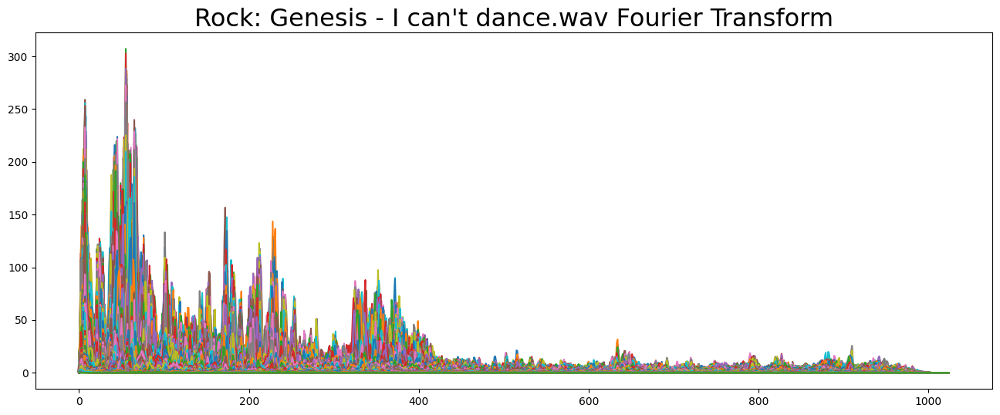

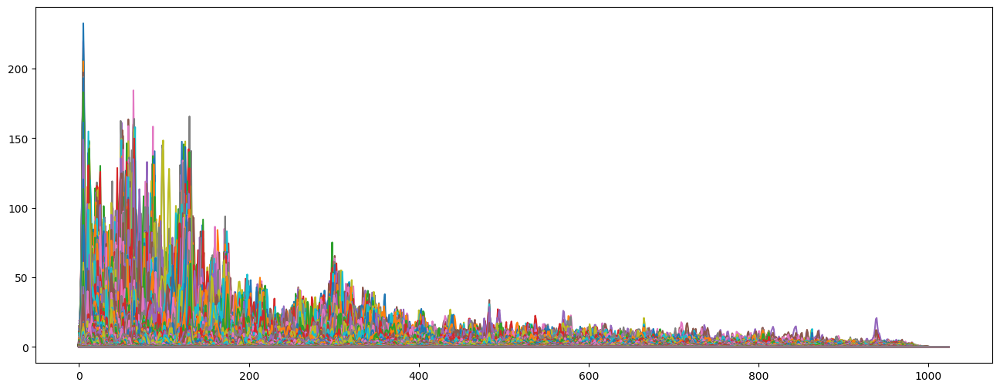

In [21]:
# Default FFT window size
n_fft = 2048 # FFT window size
hop_length = 512 # number audio of frames between STFT columns (looks like a good default)

for genre in list(os.listdir(f'{general_path}')):
  if genre == ".ipynb_checkpoints":
    continue
  song = list(os.listdir(f'{general_path}/{genre}'))[11]
  y, sr = librosa.load(f'{general_path}/{genre}/{song}')
  audio_file, _ = librosa.effects.trim(y)

  # Short-time Fourier transform (STFT)
  D = np.abs(librosa.stft(audio_file, n_fft = n_fft, hop_length = hop_length))

  plt.title(f'{genre}: {song} Fourier Transform', fontsize=23)
  plt.figure(figsize = (16, 6))
  plt.plot(D);

Spectrogram of Songs From Each Genre:

/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 10744 (\N{BIG SOLIDUS}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 65282 (\N{FULLWIDTH QUOTATION MARK}) missing from current font.
  func(*args, **kwargs)


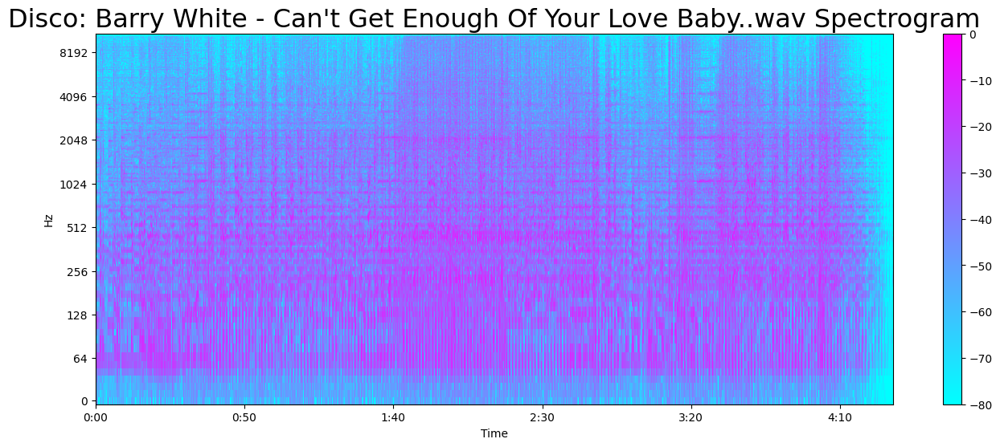

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 10744 (\N{BIG SOLIDUS}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


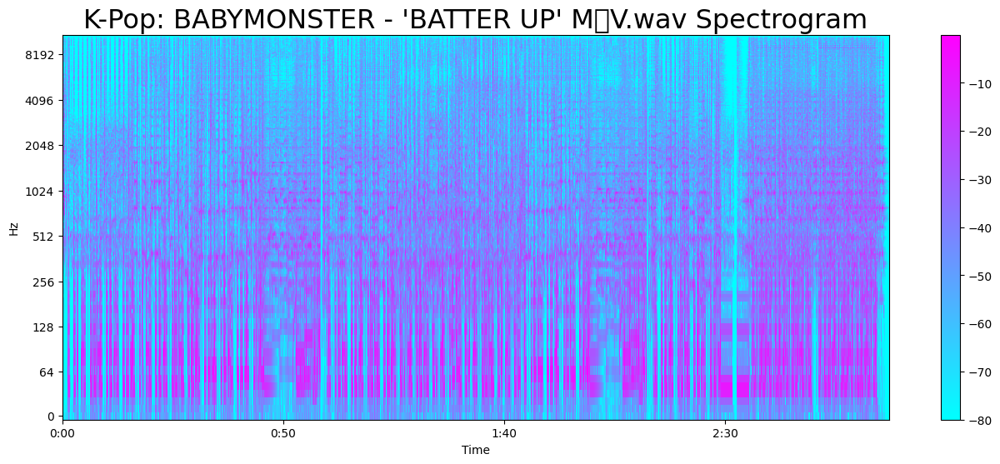

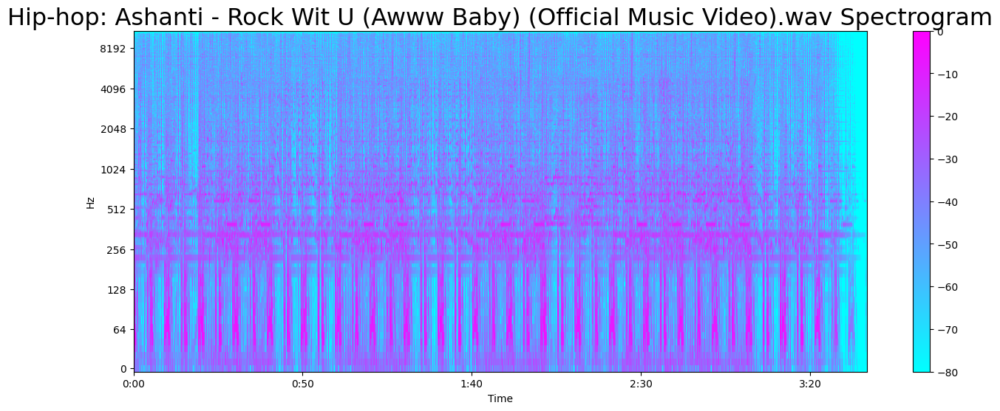

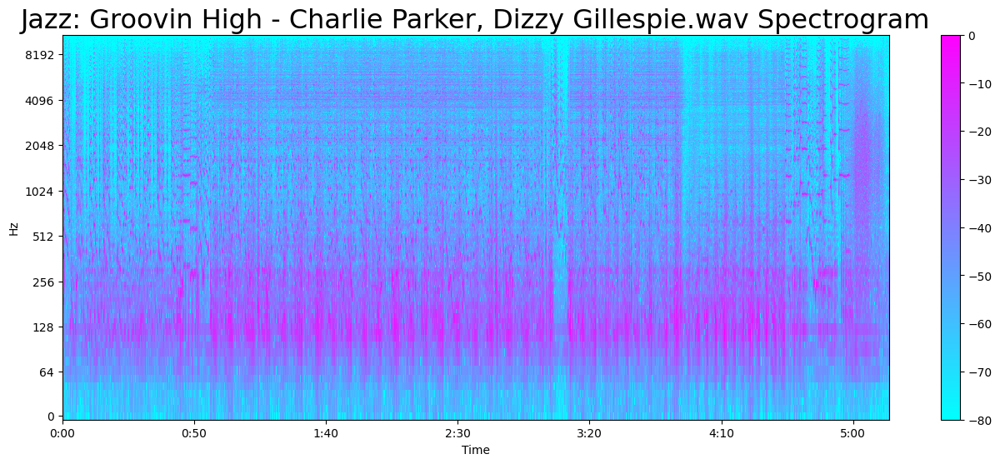

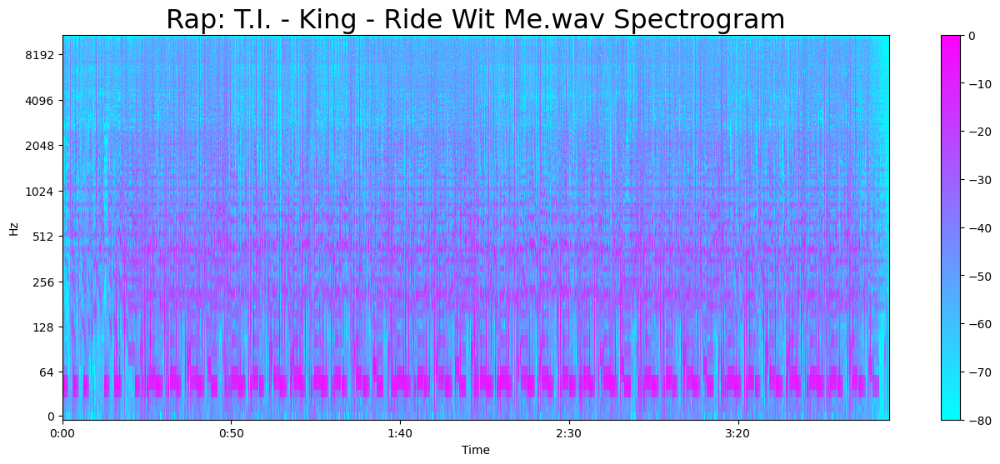

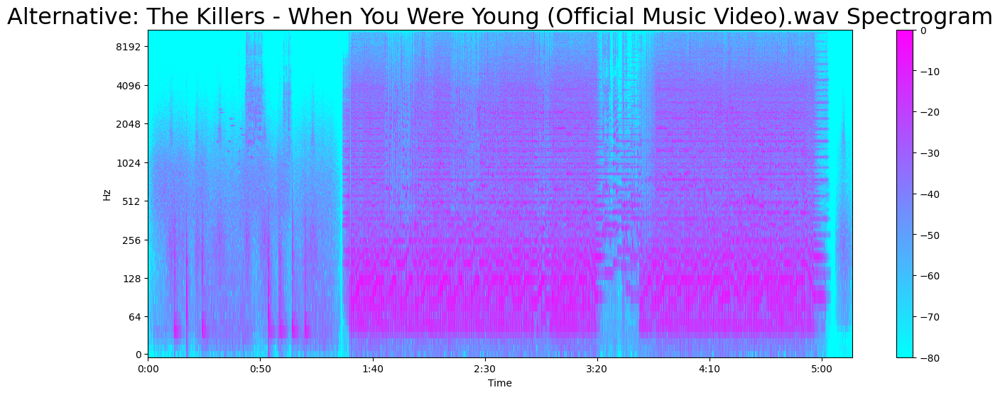

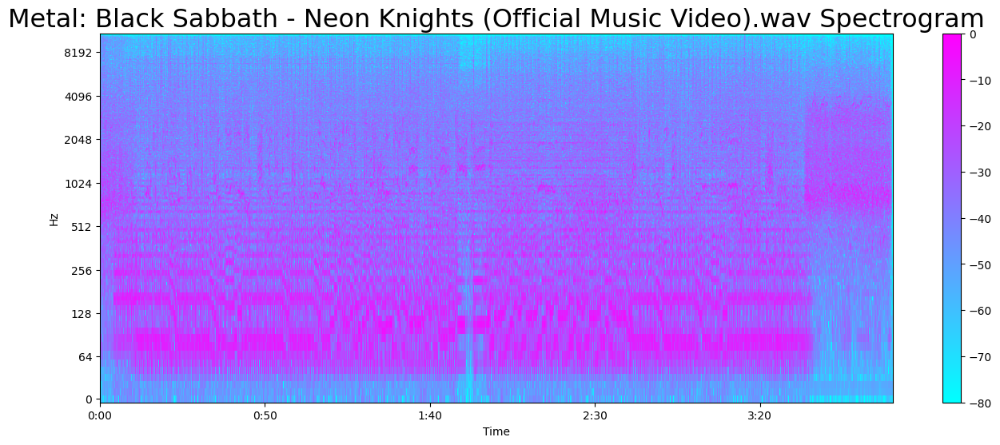

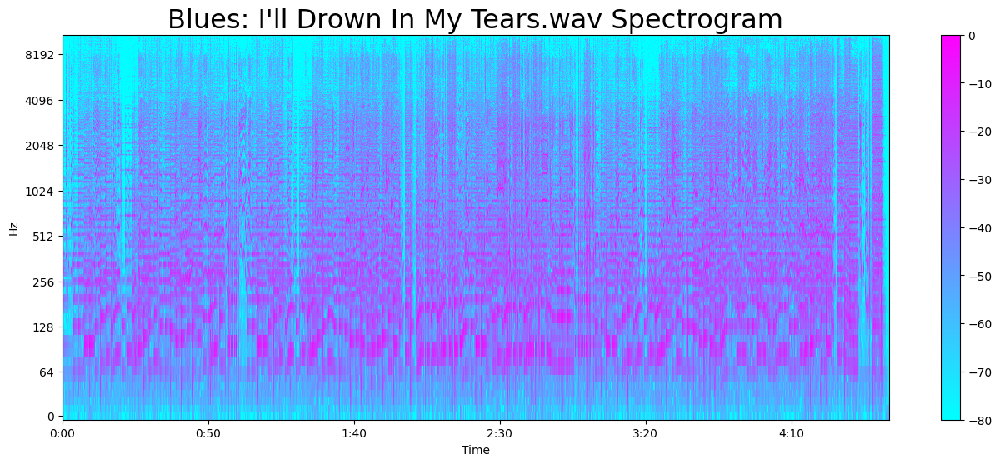

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 65282 (\N{FULLWIDTH QUOTATION MARK}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


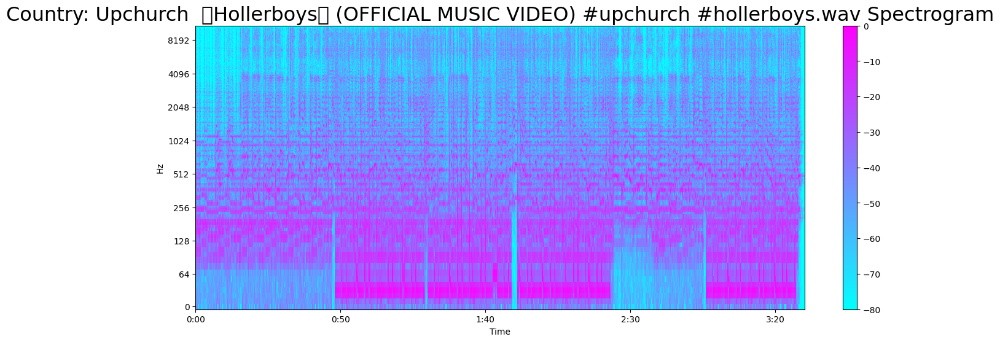

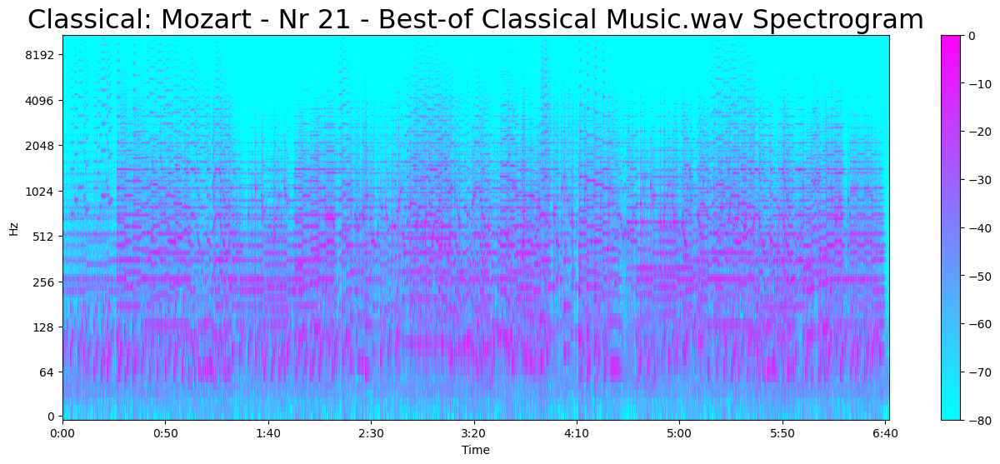

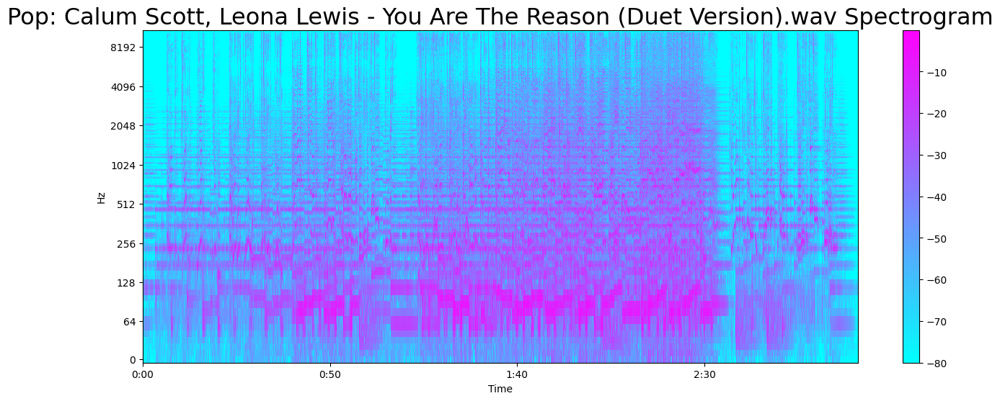

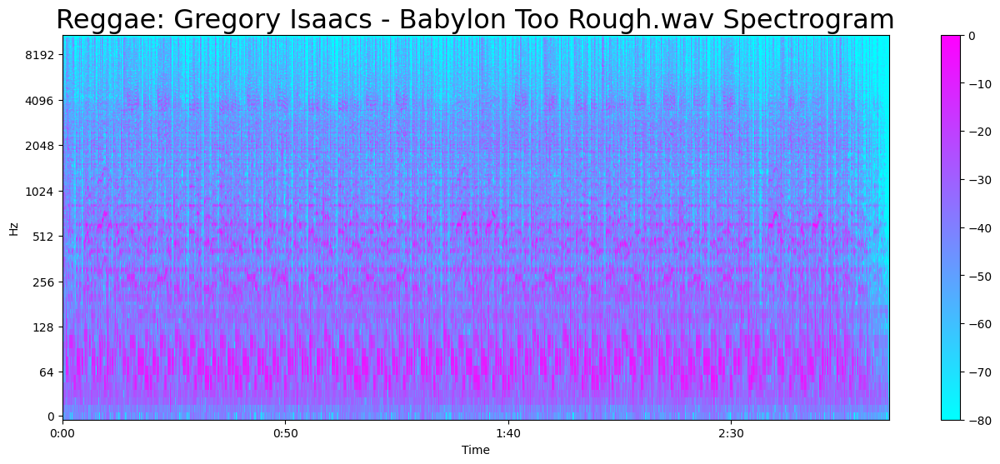

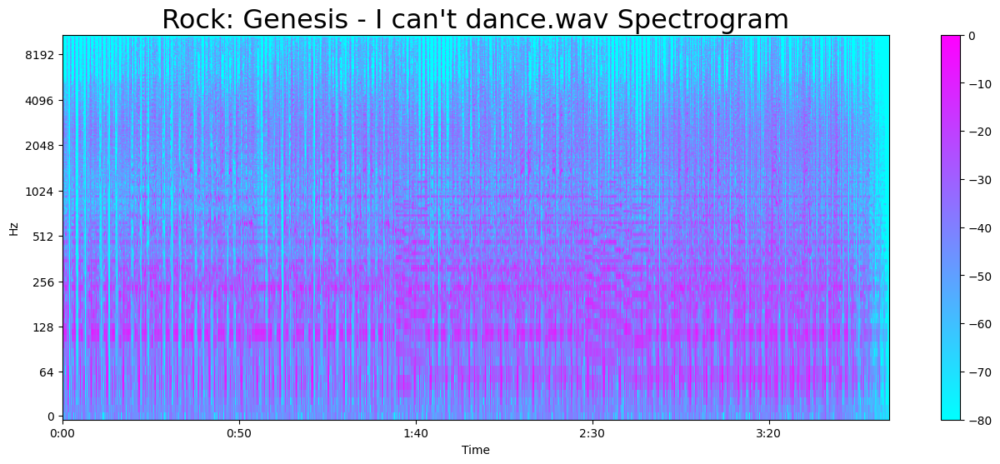

In [5]:
import os

general_path = "/content/drive/Shareddrives/Machine_Learning_Project_Drive/Youtube_Data"

for genre in list(os.listdir(f'{general_path}')):
  if genre == ".ipynb_checkpoints":
    continue
  song = list(os.listdir(f'{general_path}/{genre}'))[11]
  y, sr = librosa.load(f'{general_path}/{genre}/{song}')
  audio_file, _ = librosa.effects.trim(y)

  # Default FFT window size
  n_fft = 2048 # FFT window size
  hop_length = 512 # number audio of frames between STFT columns (looks like a good default)

  # Short-time Fourier transform (STFT)
  D = np.abs(librosa.stft(audio_file, n_fft = n_fft, hop_length = hop_length))

  # Convert an amplitude spectrogram to Decibels-scaled spectrogram.
  DB = librosa.amplitude_to_db(D, ref = np.max)

  # Creating the Spectogram
  plt.figure(figsize = (16, 6))
  plt.title(f'{genre}: {song} Spectrogram', fontsize=23)
  librosa.display.specshow(DB, sr = sr, hop_length = hop_length, x_axis = 'time', y_axis = 'log',
                          cmap = 'cool')

  plt.colorbar();

Mel Spectrogram of Songs From Each Genre:

Disco:


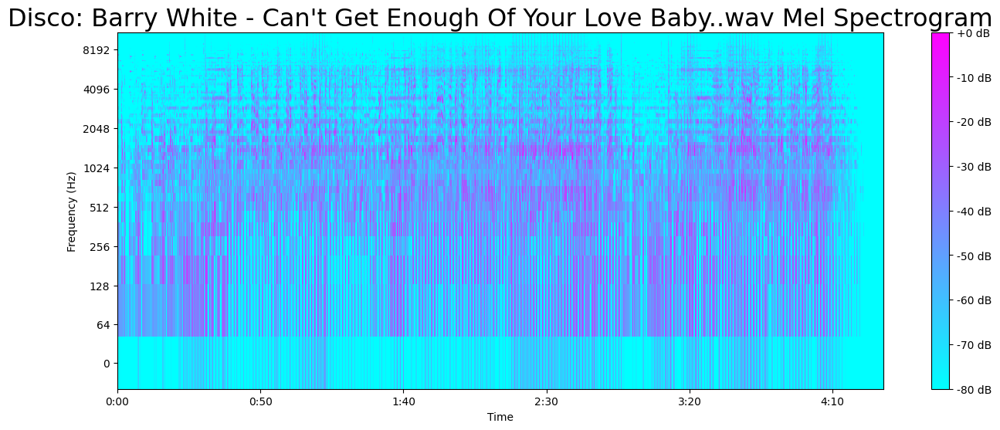

K-Pop:


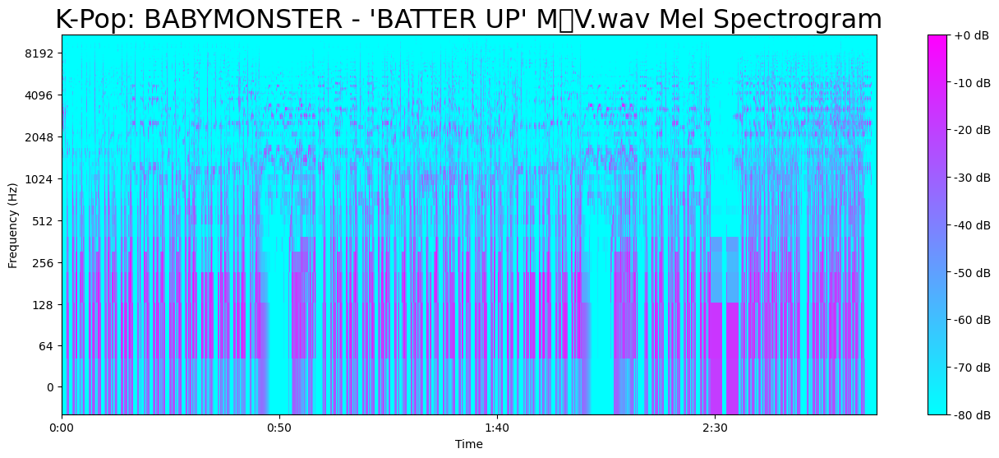

Hip-hop:


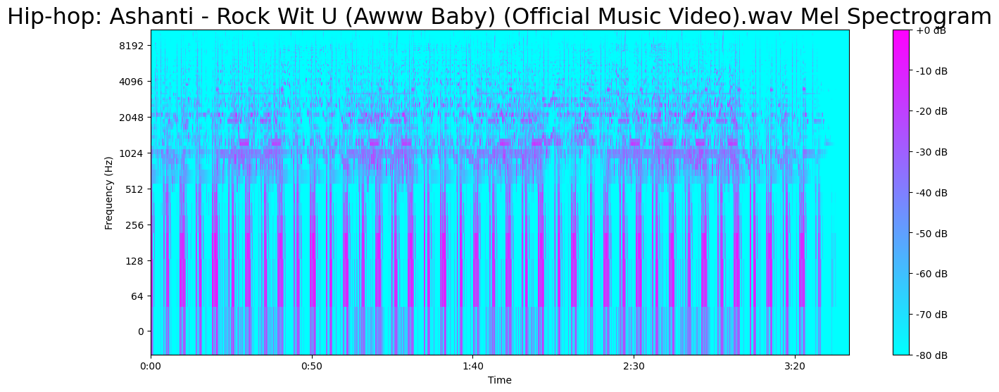

Jazz:


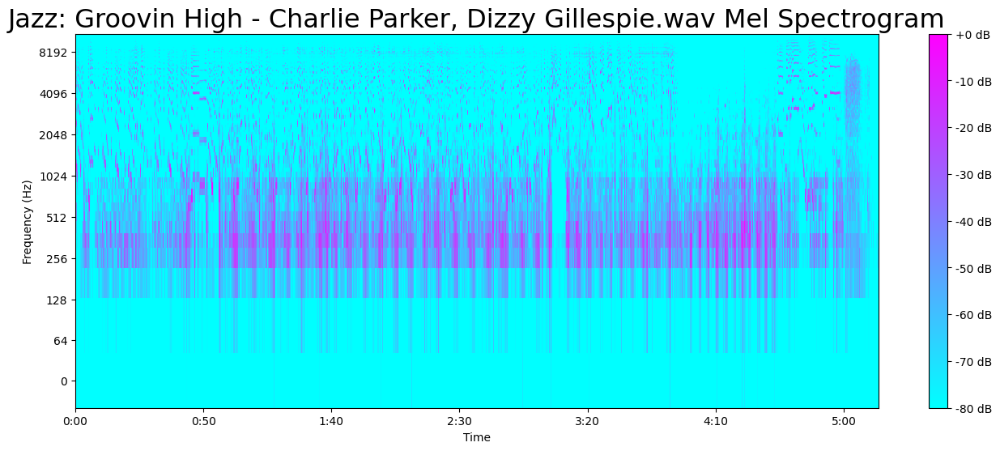

Rap:


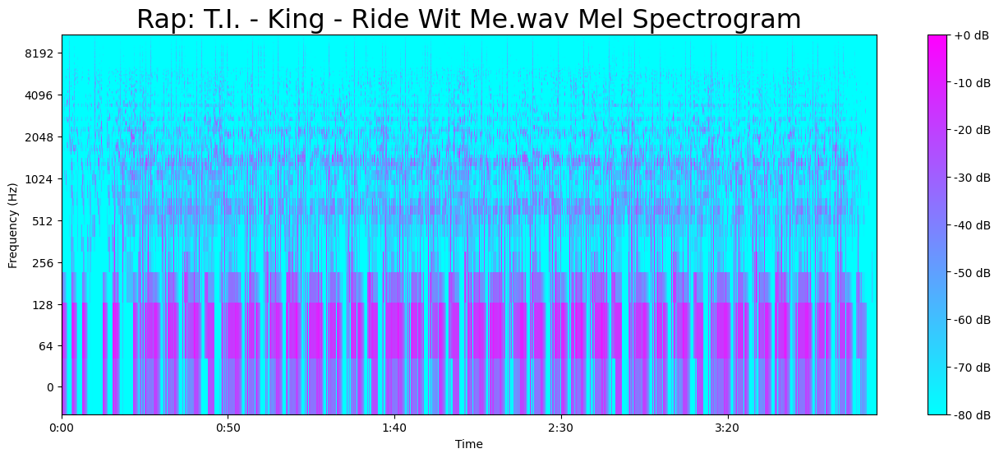

Alternative:


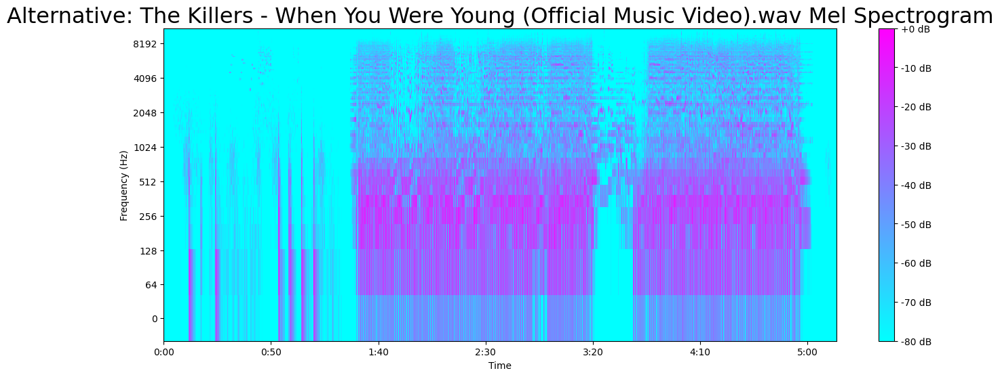

Metal:


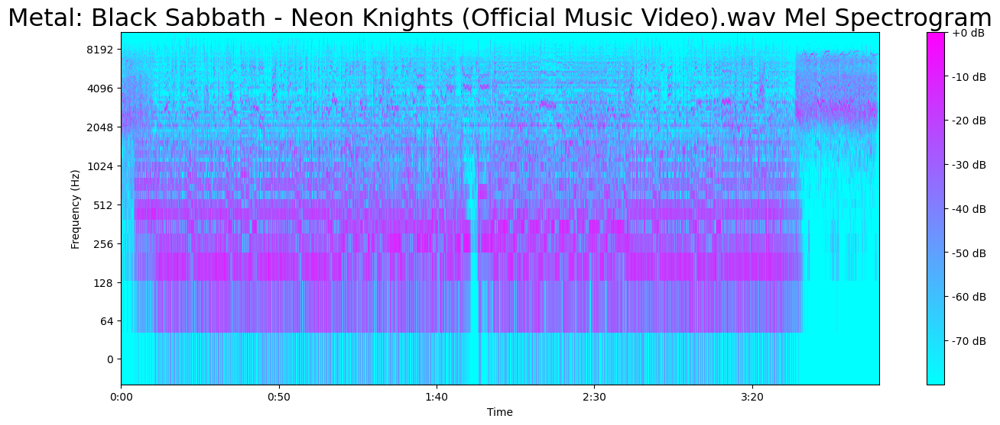

Blues:


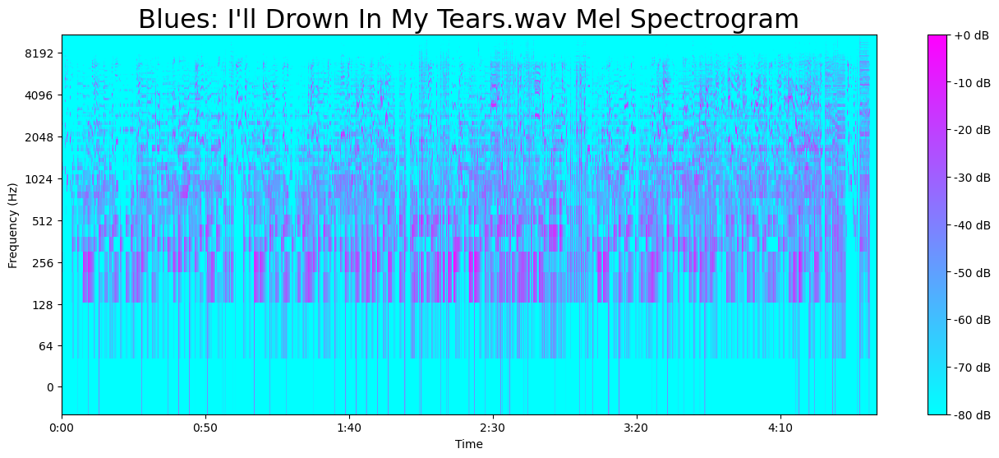

Country:


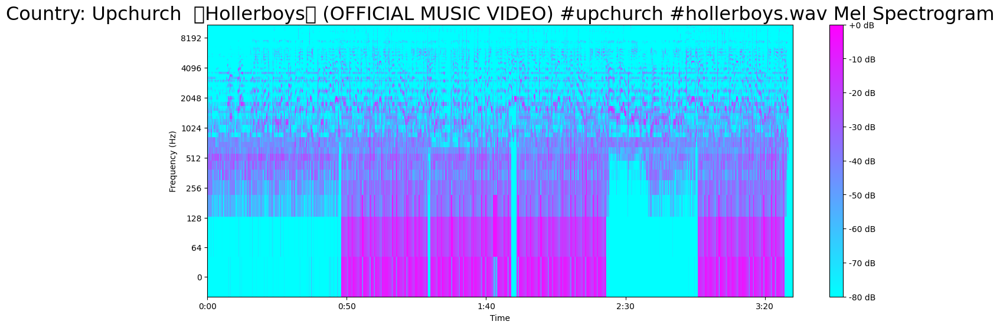

Classical:


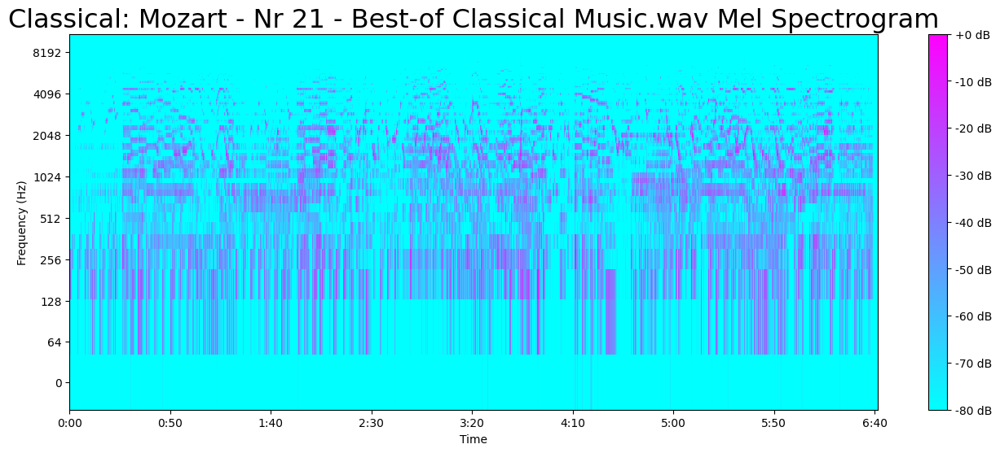

Pop:


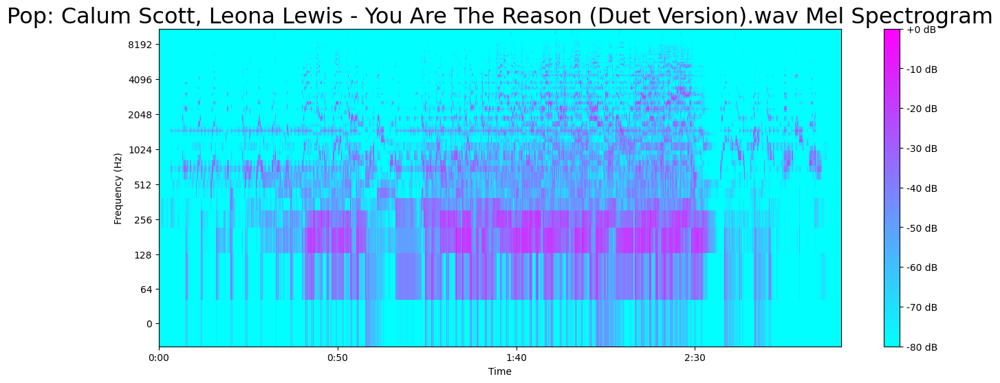

Reggae:


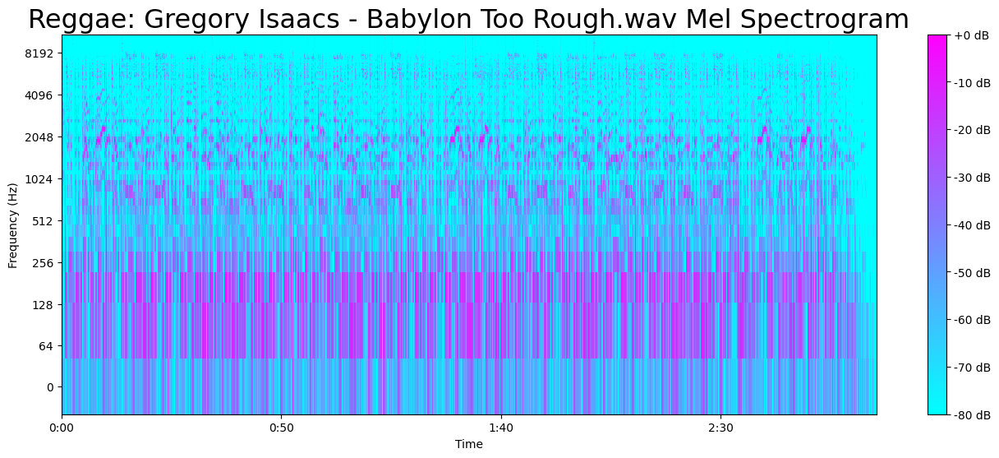

Rock:


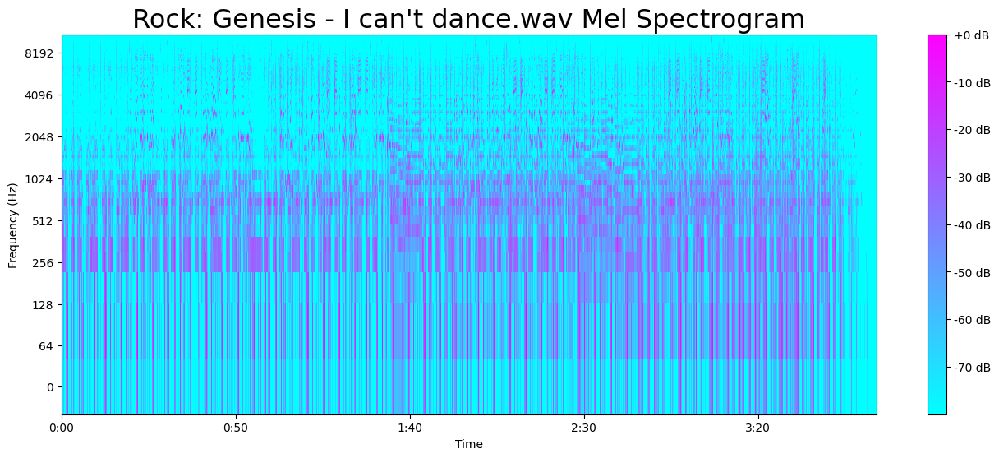

In [6]:
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt


for genre in list(os.listdir(f'{general_path}')):
  if genre == ".ipynb_checkpoints":
    continue
  print(f'{genre}:')
  song = list(os.listdir(f'{general_path}/{genre}'))[11]
  y, sr = librosa.load(f'{general_path}/{genre}/{song}')
  y, _ = librosa.effects.trim(y)

  # Generate the Mel spectrogram
  S = librosa.feature.melspectrogram(y=y, sr=sr)
  S_DB = librosa.amplitude_to_db(S, ref=np.max)

  # Plot the Mel spectrogram
  plt.figure(figsize=(16, 6))
  librosa.display.specshow(S_DB, sr=sr, hop_length=512, x_axis='time', y_axis='log', cmap='cool')
  plt.colorbar(format='%+2.0f dB')
  plt.title(f'{genre}: {song} Mel Spectrogram', fontsize=23)
  plt.xlabel("Time")
  plt.ylabel("Frequency (Hz)")
  plt.show()

Exploring all the features:

Correlation Matrix of all Features:

<Axes: >

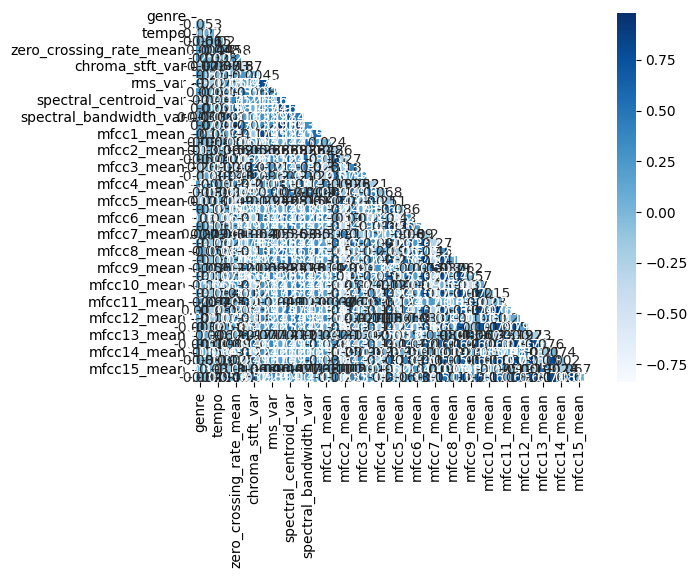

In [35]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import datasets
import pandas as pd
from sklearn.preprocessing import LabelEncoder

data = pd.read_csv('/content/drive/Shareddrives/Machine_Learning_Project_Drive/Audio_Features/all_audio_features_modified.csv')
le = LabelEncoder()
data['genre'] = le.fit_transform(data['genre'])

matrix = data.drop('song_name', axis = 1).corr()

mask = np.triu(np.ones_like(matrix, dtype=bool))

# plotting correlation matrix
sns.heatmap(matrix, cmap="Blues", annot=True, mask=mask)

Correlation Matrix for Mean Metrics:

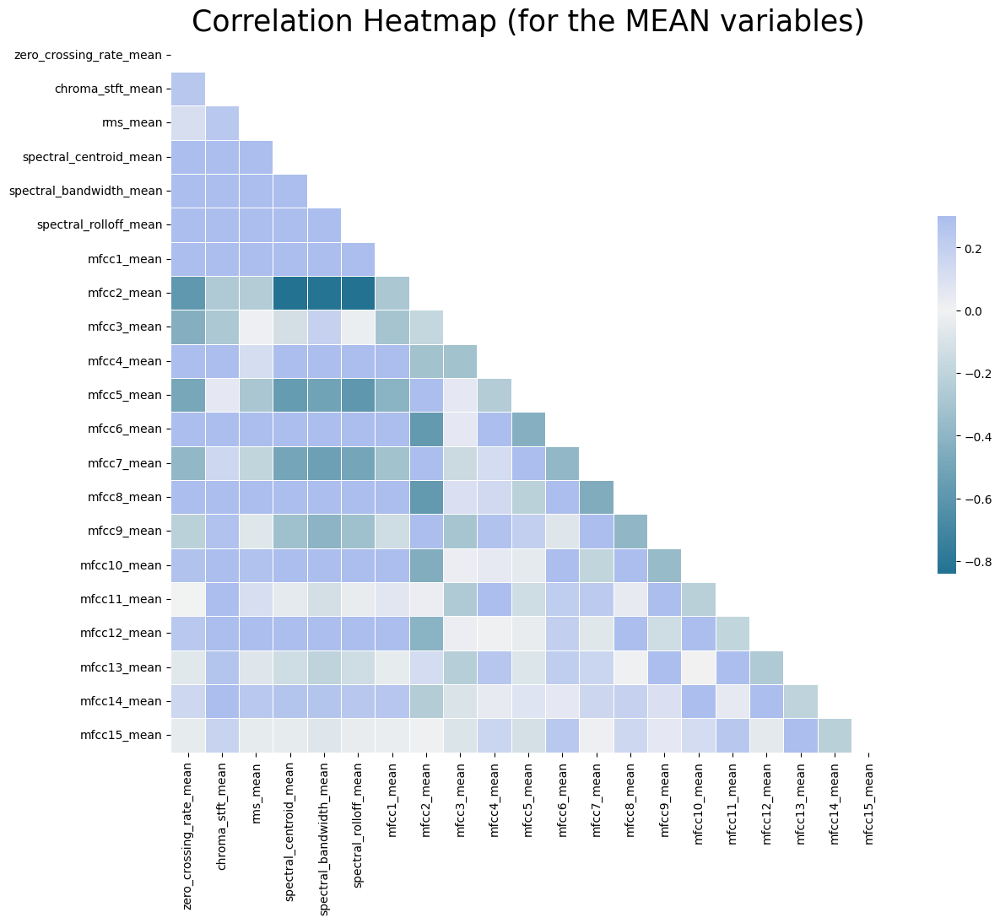

In [36]:
import seaborn as sns
# Computing the Correlation Matrix
spike_cols = [col for col in data.columns if 'mean' in col]
corr = data[spike_cols].corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(16, 11));

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 260, as_cmap=True, s = 90, l = 45, n = 5)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

plt.title('Correlation Heatmap (for the MEAN variables)', fontsize = 25)
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10);
plt.savefig("Corr Heatmap.jpg")

Columns:

In [37]:
data.columns

Index(['song_name', 'genre', 'length', 'tempo', 'sample_rate',
       'zero_crossing_rate_mean', 'chroma_stft_mean', 'chroma_stft_var',
       'rms_mean', 'rms_var', 'spectral_centroid_mean',
       'spectral_centroid_var', 'spectral_bandwidth_mean',
       'spectral_bandwidth_var', 'spectral_rolloff_mean', 'mfcc1_mean',
       'mfcc1_var', 'mfcc2_mean', 'mfcc2_var', 'mfcc3_mean', 'mfcc3_var',
       'mfcc4_mean', 'mfcc4_var', 'mfcc5_mean', 'mfcc5_var', 'mfcc6_mean',
       'mfcc6_var', 'mfcc7_mean', 'mfcc7_var', 'mfcc8_mean', 'mfcc8_var',
       'mfcc9_mean', 'mfcc9_var', 'mfcc10_mean', 'mfcc10_var', 'mfcc11_mean',
       'mfcc11_var', 'mfcc12_mean', 'mfcc12_var', 'mfcc13_mean', 'mfcc13_var',
       'mfcc14_mean', 'mfcc14_var', 'mfcc15_mean', 'mfcc15_var'],
      dtype='object')

PCA with 4 Components:

In [41]:
from sklearn import preprocessing
import pandas as pd
import numpy as np

data = pd.read_csv('/content/drive/Shareddrives/Machine_Learning_Project_Drive/Audio_Features/all_audio_features_modified.csv')

# Dropping the first column (assumed to be non-feature column) and setting up X and y
data = data.iloc[:, 1:]
y = data['genre']
X = data.drop(columns=['genre'])

# Check for non-numeric columns in X
non_numeric_cols = X.select_dtypes(exclude=[np.number]).columns
if len(non_numeric_cols) > 0:
    print("Non-numeric columns found and removed:", non_numeric_cols)
    X = X.drop(columns=non_numeric_cols)  # Drop non-numeric columns

#### NORMALIZE X ####
cols = X.columns
min_max_scaler = preprocessing.MinMaxScaler()
np_scaled = min_max_scaler.fit_transform(X)
X = pd.DataFrame(np_scaled, columns=cols)

#### PCA 2 COMPONENTS ####
from sklearn.decomposition import PCA

pca = PCA(n_components=4)
principalComponents = pca.fit_transform(X)
principalDf = pd.DataFrame(data=principalComponents, columns=['principal component 1', 'principal component 2', 'principal component 3', 'principal component 4'])

# Concatenate with target label
finalDf = pd.concat([principalDf, y.reset_index(drop=True)], axis=1)

# Explained variance
explained_variance = pca.explained_variance_ratio_
print(f"PCA explained variance ratio: {explained_variance}")
print(f"Total explained variance by 4 components: {explained_variance.sum() * 100:.2f}%")


PCA explained variance ratio: [0.26789834 0.12644501 0.10076596 0.07768982]
Total explained variance by 4 components: 57.28%


PCA with 2 Components:

In [42]:
from sklearn import preprocessing
import pandas as pd
import numpy as np

data = pd.read_csv('/content/drive/Shareddrives/Machine_Learning_Project_Drive/Audio_Features/all_audio_features_modified.csv')

# Dropping the first column (assumed to be non-feature column) and setting up X and y
data = data.iloc[:, 1:]  # Adjust this line if needed based on your actual data structure
y = data['genre']
X = data.drop(columns=['genre'])

# Check for non-numeric columns in X
non_numeric_cols = X.select_dtypes(exclude=[np.number]).columns
if len(non_numeric_cols) > 0:
    print("Non-numeric columns found and removed:", non_numeric_cols)
    X = X.drop(columns=non_numeric_cols)  # Drop non-numeric columns

#### NORMALIZE X ####
cols = X.columns
min_max_scaler = preprocessing.MinMaxScaler()
np_scaled = min_max_scaler.fit_transform(X)
X = pd.DataFrame(np_scaled, columns=cols)

#### PCA 2 COMPONENTS ####
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
principalComponents = pca.fit_transform(X)
principalDf = pd.DataFrame(data=principalComponents, columns=['principal component 1', 'principal component 2'])

# Concatenate with target label
finalDf = pd.concat([principalDf, y.reset_index(drop=True)], axis=1)

# Explained variance
explained_variance = pca.explained_variance_ratio_
print(f"PCA explained variance ratio: {explained_variance}")
print(f"Total explained variance by 2 components: {explained_variance.sum() * 100:.2f}%")


PCA explained variance ratio: [0.26789834 0.12644501]
Total explained variance by 2 components: 39.43%


PCA visualization

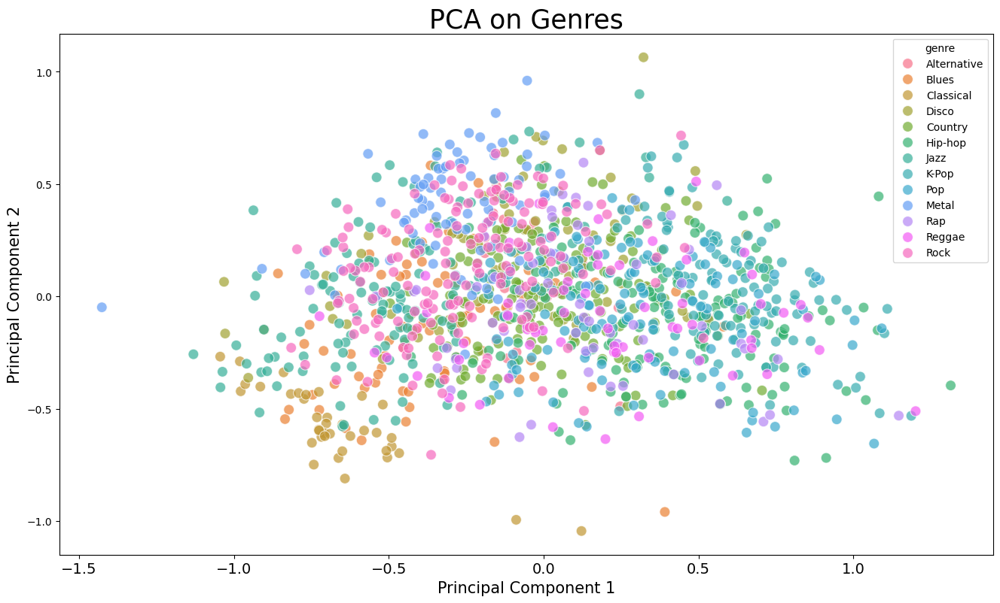

In [43]:
data = pd.read_csv('/content/drive/Shareddrives/Machine_Learning_Project_Drive/Audio_Features/all_audio_features_modified.csv')

plt.figure(figsize = (16, 9))
sns.scatterplot(x = "principal component 1", y = "principal component 2", data = finalDf, hue = "genre", alpha = 0.7,
               s = 100);

plt.title('PCA on Genres', fontsize = 25)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 10);
plt.xlabel("Principal Component 1", fontsize = 15)
plt.ylabel("Principal Component 2", fontsize = 15)
plt.savefig("PCA Scattert.jpg")